<a href="https://colab.research.google.com/github/Mateo289/TAM/blob/main/Parciales/Parcial_1_Punto_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Importaciones necesarias y descarga de dataset


In [ ]:
%pip install scikit-optimize
!pip install bayesian-optimization
!pip install -U scikit-optimize
!pip install dill

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import warnings
import scipy.stats as stats
from scipy.stats import loguniform, uniform


from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel, WhiteKernel, ConstantKernel as C
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet, SGDRegressor, BayesianRidge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, make_scorer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, train_test_split, cross_val_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, MaxAbsScaler
from sklearn.svm import SVR # Support Vector Regressor

from functools import partial

from skopt import gp_minimize

# Para optimización bayesiana (si se usa skopt)
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

# Para optimización bayesiana (si se usa bayes_opt)
from bayes_opt import BayesianOptimization

# KernelRidge (si se usa)
from sklearn.kernel_ridge import KernelRidge


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("shashanknecrothapa/ames-housing-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/ames-housing-dataset


In [ ]:
# Importar la librería pickle para guardar/cargar modelos
import pickle

#  Lectura de archivo y variable objetivo

In [ ]:
# --- Lectura del archivo CSV con Pandas ---
csv_file_name = "AmesHousing.csv"
csv_file_path = os.path.join(path, csv_file_name)

print(f"Intentando leer el archivo CSV desde: {csv_file_path}")

try:
    Xdata = pd.read_csv(csv_file_path)
    print("\n¡Archivo CSV leído exitosamente en el DataFrame 'housing'!")
    print("\nEncabezado del DataFrame 'housing':")
    Xdata.head()
except FileNotFoundError:
    print(f"Error: No se encontró el archivo CSV en la ruta: {csv_file_path}")
except Exception as e:
    print(f"Ocurrió un error al leer el archivo CSV: {e}")

Xdata.head()

Intentando leer el archivo CSV desde: /kaggle/input/ames-housing-dataset/AmesHousing.csv

¡Archivo CSV leído exitosamente en el DataFrame 'housing'!

Encabezado del DataFrame 'housing':


,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [ ]:
Xdata.info() #revisar cantidad de datos, tipos de datos, campos vacios


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

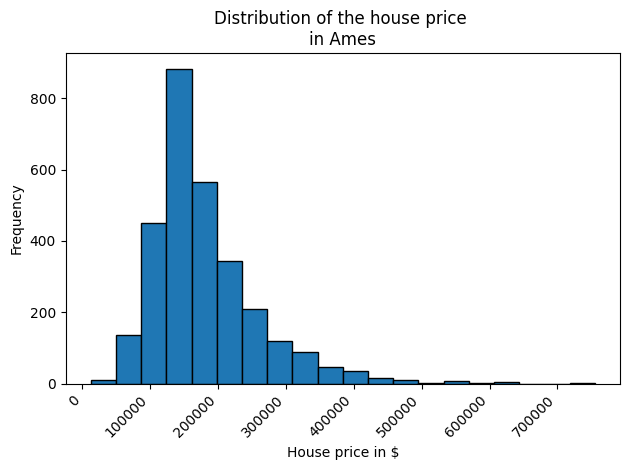

,SalePrice
0,215000
1,105000
2,172000
3,244000
4,189900


In [ ]:
target = Xdata["SalePrice"]

# Crear el histograma
target.plot.hist(bins=20, edgecolor="black")

# Etiquetas y título
plt.xlabel("House price in $")
_ = plt.title("Distribution of the house price \nin Ames")

# --- Modificaciones para ver mejor el eje X ---

# 1. Rotar las etiquetas del eje X
plt.xticks(rotation=45, ha='right') # 'ha'='right' alinea el texto a la derecha de la marca

# 2. Ajustar el diseño para evitar que las etiquetas se corten
plt.tight_layout()

plt.show()
target.head()


#  Partición en conjunto de training y testing.
Se realizará una validación hold-out, con 70% de datos para entrenamiento y 30% para evaluación. Sobre el conjunto de entrenamiento se realizará una validación cruzada de 5 folds (k=5) para determinar el mejor modelo e hiperparámetros.

Se define el atributo SalePrice como salida. y se eliminan columnas tipo ID

In [ ]:
Xdata.drop(columns=["PID"],inplace=True)
Xdata.drop(columns=["Order"],inplace=True)

In [ ]:
# Partición entrenamiento y evaluación
# Tamaño Xtrain 70%, Tamaño Xtest 30%

Xtrain, Xtest = train_test_split(Xdata,test_size=0.3)
col_sal = "SalePrice"
ytrain = Xtrain[col_sal]
ytest = Xtest[col_sal]
Xtrain.drop(columns=col_sal,inplace=True)
Xtest.drop(columns=col_sal,inplace=True)

# Preproceso: completar datos y codificar datos tipo texto

Analizando las variables numericas:

In [ ]:
numerical_data = Xdata.select_dtypes("number") #data represented with numbers.
numerical_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 37 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MS SubClass      2930 non-null   int64  
 1   Lot Frontage     2440 non-null   float64
 2   Lot Area         2930 non-null   int64  
 3   Overall Qual     2930 non-null   int64  
 4   Overall Cond     2930 non-null   int64  
 5   Year Built       2930 non-null   int64  
 6   Year Remod/Add   2930 non-null   int64  
 7   Mas Vnr Area     2907 non-null   float64
 8   BsmtFin SF 1     2929 non-null   float64
 9   BsmtFin SF 2     2929 non-null   float64
 10  Bsmt Unf SF      2929 non-null   float64
 11  Total Bsmt SF    2929 non-null   float64
 12  1st Flr SF       2930 non-null   int64  
 13  2nd Flr SF       2930 non-null   int64  
 14  Low Qual Fin SF  2930 non-null   int64  
 15  Gr Liv Area      2930 non-null   int64  
 16  Bsmt Full Bath   2928 non-null   float64
 17  Bsmt Half Bath

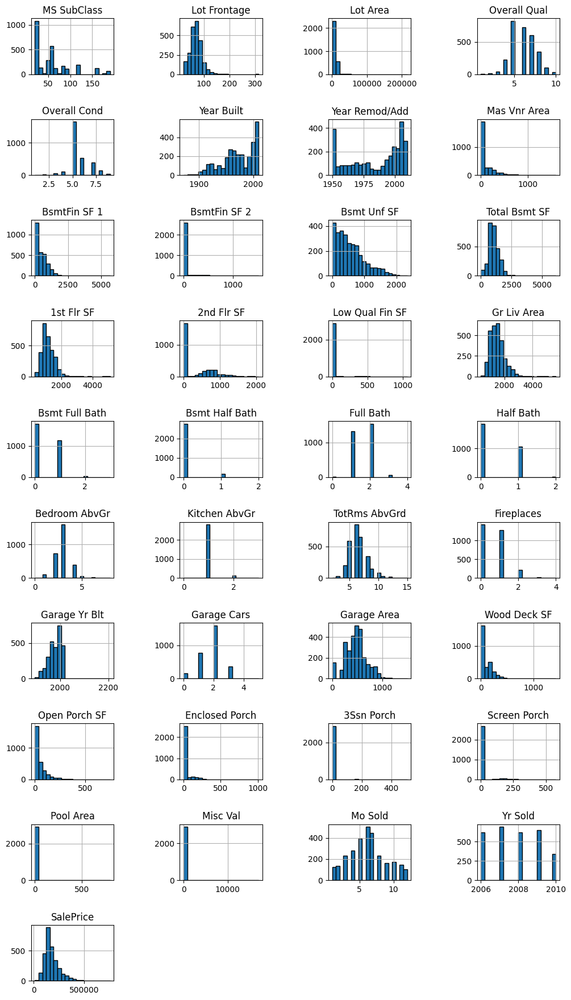

In [ ]:
numerical_data.hist(
    bins=20, figsize=(12, 22), edgecolor="black", layout=(10, 4)
)
plt.subplots_adjust(hspace=0.8, wspace=0.8)

Observamos que algunas características tienen una alta probabilidad de ser 0. Esto podría deberse a que este valor se asignó cuando el criterio no se aplicaba, por ejemplo, el área de la piscina cuando no hay piscinas disponibles.

También tenemos algunas características que codifican alguna fecha (por ejemplo, el año).

Esta información es útil y también debe considerarse al diseñar un modelo predictivo.

Ahora, veamos los datos codificados con cadenas.

In [ ]:
string_data = Xdata.select_dtypes(object)
string_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 43 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   MS Zoning       2930 non-null   object
 1   Street          2930 non-null   object
 2   Alley           198 non-null    object
 3   Lot Shape       2930 non-null   object
 4   Land Contour    2930 non-null   object
 5   Utilities       2930 non-null   object
 6   Lot Config      2930 non-null   object
 7   Land Slope      2930 non-null   object
 8   Neighborhood    2930 non-null   object
 9   Condition 1     2930 non-null   object
 10  Condition 2     2930 non-null   object
 11  Bldg Type       2930 non-null   object
 12  House Style     2930 non-null   object
 13  Roof Style      2930 non-null   object
 14  Roof Matl       2930 non-null   object
 15  Exterior 1st    2930 non-null   object
 16  Exterior 2nd    2930 non-null   object
 17  Mas Vnr Type    1155 non-null   object
 18  Exter Qu

Estas características son categóricas. Podemos crear un gráfico de barras para ver el recuento de categorías para cada característica.


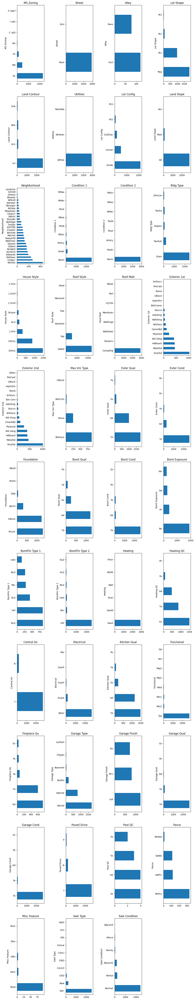

In [ ]:
from math import ceil
from itertools import zip_longest

n_string_features = string_data.shape[1]
nrows, ncols = ceil(n_string_features / 4), 4

fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(14, 80))

for feature_name, ax in zip_longest(string_data, axs.ravel()):
    if feature_name is None:
        # do not show the axis
        ax.axis("off")
        continue

    string_data[feature_name].value_counts().plot.barh(ax=ax)
    ax.set_title(feature_name)

plt.subplots_adjust(hspace=0.2, wspace=0.8)

Trazar esta información nos permite responder a dos preguntas:

¿Existen pocas o muchas categorías para una característica dada?

¿Existen categorías poco comunes para algunas características?

Conocer estas peculiaridades facilitaría el diseño del proceso predictivo.

(Not a Number, o valores faltantes), a menudo significa que la ausencia de información es en sí misma una categoría significativa.

Para el dataset de Ames Housing, esto es particularmente cierto para un gran número de columnas relacionadas con características opcionales de la casa. La documentación del dataset a menudo aclara esto.

Información Valiosa: La ausencia de una característica (como un sótano o una piscina) es una información muy relevante para el valor de una propiedad. Tratarlo como un simple valor faltante y rellenarlo con la moda de otras categorías con la característica presente, perdería esta información.

Para ser explícito y más robusto, es una muy buena práctica rellenar esos NaN con una cadena como 'None' o 'No_Feature' ANTES de aplicar cualquier imputación de la moda, si es que la moda podría ser otra categoría. Esto asegura que 'None' sea tratado como una categoría distinta y que no se pierda la información. sin embargo se hara imputacion de datos omitiendo esto para poder hacer una comparacion de modelos mas robustos.

Por lo tanto, separamos nuestars variables numericas de las categoricas:

In [ ]:
numerical_features = [

    "MS SubClass",
    "Lot Frontage",
    "Lot Area",
    "Year Built",
    "Year Remod/Add",
    "Overall Qual",
    "Overall Cond",
    "Mas Vnr Area",
    "BsmtFin SF 1",
    "BsmtFin SF 2",
    "Bsmt Unf SF",
    "Total Bsmt SF",
    "1st Flr SF",
    "2nd Flr SF",
    "Low Qual Fin SF",
    "Gr Liv Area",
    "Bsmt Full Bath",
    "Bsmt Half Bath",
    "Full Bath",
    "Half Bath",
    "Bedroom AbvGr",
    "Kitchen AbvGr",
    "TotRms AbvGrd",
    "Fireplaces",
    "Garage Yr Blt",
    "Garage Cars",
    "Garage Area",
    "Wood Deck SF",
    "Open Porch SF",
    "Enclosed Porch",
    "3Ssn Porch",
    "Screen Porch",
    "Pool Area",
    "Misc Val",
    "Mo Sold",
    "Yr Sold",
]

# Identify nominal and ordinal features based on common Ames Housing interpretation
# This list is based on typical interpretations and might need adjustment based on specific analysis
nominal_features = [
    'MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities',
    'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1', 'Condition 2',
    'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl', 'Exterior 1st',
    'Exterior 2nd', 'Mas Vnr Type', 'Foundation', 'Heating', 'Central Air',
    'Electrical', 'Functional', 'Garage Type', 'Paved Drive', 'Misc Feature',
    'Sale Type', 'Sale Condition'
]

ordinal_features = [
    'Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
    'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating QC', 'Kitchen Qual',
    'Fireplace Qu', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Pool QC', 'Fence'
]

# Define the order for ordinal categories where a clear order exists
# This mapping is crucial for OrdinalEncoder to work correctly
ordinal_categories_map = {
    'Exter Qual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Exter Cond': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Bsmt Qual': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Bsmt Cond': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Bsmt Exposure': ['None', 'No', 'Mn', 'Av', 'Gd'],
    'BsmtFin Type 1': ['None', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],
    'BsmtFin Type 2': ['None', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],
    'Heating QC': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Kitchen Qual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Fireplace Qu': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Garage Finish': ['None', 'Unf', 'RFn', 'Fin'],
    'Garage Qual': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Garage Cond': ['None', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'Pool QC': ['None', 'Fa', 'TA', 'Gd', 'Ex'],
    'Fence': ['None', 'MnWw', 'GdWo', 'MnPrv', 'GdPrv']
}


print("\nNumerical Features:")
print(numerical_features)
print("\nNominal Features:")
print(nominal_features)
print("\nOrdinal Features:")
print(ordinal_features)

# Check if all categorical features are accounted for
all_features = set(Xdata.columns)
identified_features = set(numerical_features + nominal_features + ordinal_features + ['SalePrice', 'PID', 'Order']) # Add back columns removed earlier

if all_features != identified_features:
    unaccounted_features = list(all_features - identified_features)
    print(f"\nWarning: The following features are not in the numerical, nominal, or ordinal lists: {unaccounted_features}")


Numerical Features:
['MS SubClass', 'Lot Frontage', 'Lot Area', 'Year Built', 'Year Remod/Add', 'Overall Qual', 'Overall Cond', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold', 'Yr Sold']

Nominal Features:
['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Foundation', 'Heating', 'Central Air', 'Electrical', 'Functional', 'Garage Type', 'Paved Drive', 'Misc Feature', 'Sale Type', 'Sale Condition']

Ordinal Fe

In [ ]:
Xdata['Yr Sold'].value_counts()

,count
Yr Sold,
2007,694
2009,648
2006,625
2008,622
2010,341


# Se crea clase propia (custom) para ejecutar preproceso que sea compatible con scikitlearn




In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, StandardScaler # Import StandardScaler
from sklearn.pipeline import Pipeline # Import Pipeline
from sklearn.compose import ColumnTransformer # Import ColumnTransformer
from sklearn.base import clone # Import clone for safe pipeline copying
import pandas as pd # Import pandas
import numpy as np # Import numpy


class mypre_houses(BaseEstimator, TransformerMixin):
    """
    Clase para preprocesar datos, incluyendo imputación, escalado de numéricas,
    One-Hot Encoding para categóricas nominales y Ordinal Encoding para categóricas ordinales.
    Handles NaNs by filling certain columns with 'None' before applying transformers.
    """
    def __init__(self, numerical_features, nominal_features, ordinal_features, ordinal_categories_map):
        self.numerical_features = numerical_features
        self.nominal_features = nominal_features
        self.ordinal_features = ordinal_features
        self.ordinal_categories_map = ordinal_categories_map
        self.preprocessor = None # ColumnTransformer se inicializa en fit
        self.feature_names_out_ = None # Para almacenar los nombres de las columnas de salida
        self._fitted_ordinal_categories = None # To store the categories actually used by OrdinalEncoder

    def fit(self, X, y=None):
        # Asegurarse de que X sea un DataFrame para la selección de columnas y el manejo de índices
        if not isinstance(X, pd.DataFrame):
            # Attempt to convert to DataFrame, assuming column order matches the feature lists
            # This is a fallback and assumes consistency. Better to always pass DataFrames.
            print("Advertencia: La entrada X no es un DataFrame. Intentando convertir.")
            try:
                 all_feature_names = self.numerical_features + self.nominal_features + self.ordinal_features
                 X = pd.DataFrame(X, columns=all_feature_names)
            except Exception as e:
                 print(f"Error al convertir X a DataFrame: {e}")
                 # Re-raise or handle appropriately if conversion fails
                 raise


        # Handle NaNs that mean "Absence of Feature" by filling with 'None'
        # This is done *before* the ColumnTransformer
        cols_nan_is_none = [
            'Alley', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
            'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish',
            'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature',
            'Mas Vnr Type' # Mas Vnr Type can also be NaN (None)
        ]
        # Apply fillna only to columns that exist in the current DataFrame X
        for col in cols_nan_is_none:
            if col in X.columns:
                X[col] = X[col].fillna('None')

        # Also handle a few numerical columns that have missing values that might imply 0
        # based on dataset documentation or common sense (e.g., no garage = 0 garage cars/area)
        # Check if these columns are in the numerical features list before filling
        num_cols_nan_is_zero = ['GarageYrBlt', 'GarageCars', 'GarageArea', 'BsmtFinSF1', 'BsmtFinSF2',
                                'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'MasVnrArea',
                                'LotFrontage'] # LotFrontage is often imputed, median is reasonable, but 0 might be okay if house has no lot frontage? Median is safer.

        for col in num_cols_nan_is_zero:
            if col in X.columns and col in self.numerical_features:
                 # For LotFrontage and MasVnrArea, median imputation is more standard
                 if col in ['LotFrontage', 'MasVnrArea']:
                      # Use SimpleImputer within the pipeline for these to avoid data leakage if median is calculated on full data
                      pass # Handled by numerical_pipeline imputer
                 else:
                    # For SF/Bath/Cars/Area related to absence, 0 is a meaningful fill
                    X[col] = X[col].fillna(0)


        # 1. Identify the features that actually exist in X
        # This is important to prevent errors if any column from the lists is not present in the dataset
        num_features_exist = [col for col in self.numerical_features if col in X.columns]
        nom_features_exist = [col for col in self.nominal_features if col in X.columns]
        ord_features_exist = [col for col in self.ordinal_features if col in X.columns]

        # Debugging prints (optional, can remove after fixing)
        # print(f"mypre_houses.fit: ord_features_exist = {ord_features_exist}")


        # 2. Define Pipelines for each type of feature
        #    a. Pipeline for numerical features: Imputation + Scaling
        #       Use median for LotFrontage and MasVnrArea as they are general measurements
        #       Other numerical NaNs that imply absence were filled with 0 above.
        numerical_pipeline = Pipeline(steps=[
            ('num_imputer', SimpleImputer(strategy='median')), # Impute remaining NaNs (LotFrontage, MasVnrArea) with median
            ('scaler', StandardScaler()) # Scale numerical data
        ])

        #    b. Pipeline for nominal features: One-Hot Encoding
        #       NaNs were filled with 'None' or already handled. No imputer needed here.
        nominal_pipeline = Pipeline(steps=[
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=True)) # Use sparse_output=True for efficiency
        ])

        #    c. Pipeline for ordinal features: Ordinal Encoding
        #       NaNs were filled with 'None'. No imputer needed here.
        #       Build ordered_categories_for_ordinal to be a list of lists, one list per feature
        ordered_categories_for_ordinal = []
        self._fitted_ordinal_categories = [] # Store the categories actually used

        for col in ord_features_exist:
            if col in self.ordinal_categories_map:
                # Use the predefined order if available
                category_list = self.ordinal_categories_map[col]
                ordered_categories_for_ordinal.append(category_list)
                self._fitted_ordinal_categories.append(category_list)
            else:
                # If no predefined order, learn from the unique values in the training data
                # Ensure 'None' is included if it was filled
                unique_categories = X[col].unique().tolist()
                # Sort unique categories if needed, or rely on OrdinalEncoder's default sorting if 'auto' were used (but we're not using 'auto' here)
                # For robustness, explicitly define order or handle carefully.
                # Given the issue, let's just use the unique values as a list, OrdinalEncoder will assign integers based on this list's order.
                # A warning might be appropriate if relying on inferred order for ordinal features.
                print(f"Advertencia: No se especificaron categorías explícitas para la característica ordinal '{col}'. OrdinalEncoder usará el orden de aparición de los valores únicos en los datos de entrenamiento.")
                category_list = sorted(unique_categories) # Sorting unique values for consistency if no map is provided
                ordered_categories_for_ordinal.append(category_list)
                self._fitted_ordinal_categories.append(category_list)


        # Debugging prints (optional, can remove after fixing)
        # print(f"mypre_houses.fit: ordered_categories_for_ordinal (length {len(ordered_categories_for_ordinal)}) = {ordered_categories_for_ordinal}")
        # if ordered_categories_for_ordinal:
        #      print(f"mypre_houses.fit: First category list length: {len(ordered_categories_for_ordinal[0])}")
        #      if len(ordered_categories_for_ordinal) != len(ord_features_exist):
        #           print(f"mypre_houses.fit: CRITICAL ERROR - Mismatch between number of ordinal features ({len(ord_features_exist)}) and category lists ({len(ordered_categories_for_ordinal)}).")


        # Initialize OrdinalEncoder with the determined categories (list of lists).
        # The number of lists in 'categories' must match the number of ordinal features being transformed.
        # If ord_features_exist is empty, ordered_categories_for_ordinal will be empty, which OrdinalEncoder handles.
        # Use self._fitted_ordinal_categories which is guaranteed to be a list of lists (or empty)
        ordinal_encoder_instance = OrdinalEncoder(
            categories=self._fitted_ordinal_categories, # Provide categories as a list of lists
            handle_unknown='use_encoded_value', # Handle unknown categories
            unknown_value=-1 # Assign -1 to any category not seen during fit
        )

        # Removed SimpleImputer from ordinal_pipeline as NaNs are filled explicitly before ColumnTransformer
        ordinal_pipeline = Pipeline(steps=[
            ('ordinal', ordinal_encoder_instance)
        ])

        # 3. Crear el ColumnTransformer
        # Build the list of transformers dynamically based on which feature types exist in X
        transformers = []
        if num_features_exist:
            transformers.append(('num_pipe', numerical_pipeline, num_features_exist))
        if nom_features_exist:
             transformers.append(('nom_pipe', nominal_pipeline, nom_features_exist))
        # Only add ordinal pipeline if there are ordinal features to process
        if ord_features_exist:
             transformers.append(('ord_pipe', ordinal_pipeline, ord_features_exist))

        # Debugging print (optional, can remove after fixing)
        # print(f"mypre_houses.fit: ColumnTransformer transformers list (length {len(transformers)}) = {transformers}")


        # Check if any transformers were added
        if not transformers:
             print("Advertencia: No se encontraron características numéricas, nominales u ordinales para preprocesar.")
             # Handle this case: maybe return an empty transformer or raise an error
             # For now, create a ColumnTransformer that just passes through the data
             self.preprocessor = ColumnTransformer(transformers=[], remainder='passthrough')
        else:
            self.preprocessor = ColumnTransformer(
                transformers=transformers,
                remainder='passthrough' # Keep any other column not specified (without transforming)
                # If you want to drop unspecified columns, use 'drop' instead of 'passthrough'
            )

        # Ajustar el preprocesador a los datos de entrenamiento (X)
        self.preprocessor.fit(X)

        # 4. Guardar los names de las columnas de salida limpia para usarlos en el método transform
        # ColumnTransformer.get_feature_names_out() returns names with pipeline prefixes (e.g., 'num_pipe__LotArea')
        # We clean them to have more readable and usable names for the output DataFrame.
        # This part needs to handle the sparse output from OneHotEncoder correctly.
        # get_feature_names_out() should handle this, but cleaning requires care.
        # A simpler approach might be to just use the names as provided by get_feature_names_out().

        # Let's try getting the names directly first, as cleaning can introduce bugs if not done perfectly.
        # The models/pipelines downstream should be able to handle these names.
        # If issues arise later, we can revisit cleaning the names.
        self.feature_names_out_ = self.preprocessor.get_feature_names_out()


        return self

    def transform(self, X, y=None):
        # Asegurarse de que X sea un DataFrame para la selección de columnas y el manejo de índices
        if not isinstance(X, pd.DataFrame):
            # Attempt to convert to DataFrame, assuming column order matches the feature lists
             print("Advertencia: La entrada X no es un DataFrame en transform. Intentando convertir.")
             try:
                 all_feature_names = self.numerical_features + self.nominal_features + self.ordinal_features
                 X = pd.DataFrame(X, columns=all_feature_names)
             except Exception as e:
                 print(f"Error al convertir X a DataFrame en transform: {e}")
                 # Re-raise or handle appropriately
                 raise


        # Apply the same NaN filling as in fit
        cols_nan_is_none = [
            'Alley', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
            'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish',
            'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature',
            'Mas Vnr Type'
        ]
         # Apply fillna only to columns that exist in the current DataFrame X
        for col in cols_nan_is_none:
            if col in X.columns:
                 X[col] = X[col].fillna('None')

        num_cols_nan_is_zero = ['GarageYrBlt', 'GarageCars', 'GarageArea', 'BsmtFinSF1', 'BsmtFinSF2',
                                'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'MasVnrArea',
                                'LotFrontage']
        for col in num_cols_nan_is_zero:
            if col in X.columns and col in self.numerical_features:
                 # For LotFrontage and MasVnrArea, median imputation is handled by the pipeline
                 if col not in ['LotFrontage', 'MasVnrArea']:
                     # For SF/Bath/Cars/Area related to absence, 0 is a meaningful fill
                     X[col] = X[col].fillna(0)


        # Aplicar las transformaciones usando el preprocesador ajustado
        X_transformed_array = self.preprocessor.transform(X)

        # If the output is sparse (due to OneHotEncoder), convert to dense array
        if hasattr(X_transformed_array, 'toarray'):
            X_transformed_array = X_transformed_array.toarray()


        # Convert the array of output to a Pandas DataFrame
        # Use self.feature_names_out_ which was calculated in the fit method.
        # Ensure the length of columns matches the transformed array's second dimension
        if len(self.feature_names_out_) != X_transformed_array.shape[1]:
             print(f"Error: Mismatch between number of output feature names ({len(self.feature_names_out_)}) "
                   f"and transformed data columns ({X_transformed_array.shape[1]}).")
             # This indicates an issue in get_feature_names_out() or the transformation output shape.
             # For debugging, you might want to inspect self.preprocessor.get_feature_names_out()
             # and X_transformed_array.shape here.
             # Decide how to handle: raise error, attempt to guess names, etc.
             # For now, let's raise an error as column names are essential.
             raise ValueError("Shape mismatch after transformation. Column names cannot be assigned.")


        X_preprocessed = pd.DataFrame(
            X_transformed_array,
            columns=self.feature_names_out_,
            index=X.index # Maintain the original index of the input DataFrame
        )

        return X_preprocessed


    def fit_transform(self, X, y=None):
        """
        Convenience method that fits the transformer and then transforms the data.
        """
        # Call fit first to set up the preprocessor and learn column names
        self.fit(X, y)
        # Then call transform
        return self.transform(X, y)


    def get_feature_names_out(self, input_features=None):
        """
        Get output feature names from the ColumnTransformer.
        Pass input_features if needed, though the internal fit/transform should handle it.
        """
        # Rely on the preprocessor's get_feature_names_out()
        # This method is called internally by the ColumnTransformer after fit.
        # When called externally, you might need to pass input_features if the
        # ColumnTransformer was not fitted yet or if you need names for different inputs.
        # However, for this class, it's mainly used internally after self.preprocessor.fit().
        if self.preprocessor is not None:
             return self.preprocessor.get_feature_names_out(input_features)
        else:
             # Preprocessor not fitted yet, return None or raise error
             print("Error: get_feature_names_out called before preprocessor was fitted.")
             return None # Or raise ValueError("Preprocessor not fitted yet.")

In [ ]:
mypre = mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)
Xtrain_pre = mypre.fit_transform(Xtrain)

Nota: Ninguna etapa del proceso puede utilizar los datos de test para sintonizar parámetros.

In [ ]:
Xtest_pre = mypre.transform(Xtest) #no se puede fit solo transform-> parámetros ajustados sobre Xtrain

In [ ]:
Xtrain_pre.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2051 entries, 2091 to 306
Columns: 244 entries, num_pipe__MS SubClass to ord_pipe__Fence
dtypes: float64(244)
memory usage: 3.8 MB


# **GUARDADO DE LAS VARIABLES DE TEST PARA STREAMLIT**

In [ ]:
df_preprocessed_Xtest = pd.concat([Xtest_pre], axis=1)
df_preprocessed_ytest = pd.concat([ytest], axis=1)

print(df_preprocessed_Xtest.shape)
print(df_preprocessed_ytest.shape)

(879, 244)
(879, 1)


In [ ]:
# Definir ruta de almacenamiento en Drive
ruta_drive = '/content/drive/My Drive/MODELOS_TAM/TEST_DATA/'

# Crear la carpeta si no existe
if not os.path.exists(ruta_drive):
    print("⚠️ La carpeta no existe en Drive. Creándola...")
    os.makedirs(ruta_drive)
else:
    print("✅ La carpeta sí existe en Drive.")


✅ La carpeta sí existe en Drive.


In [ ]:
# Guardar los archivos en Google Drive
df_preprocessed_ytest.to_csv(os.path.join(ruta_drive, 'ytest_for_streamlit.csv'), index=False)
df_preprocessed_Xtest.to_csv(os.path.join(ruta_drive, 'Xtest_for_streamlit.csv'), index=False)

# Verificar que los archivos se guardaron correctamente
print("📂 Archivos guardados en Drive:")
print(os.listdir(ruta_drive))


📂 Archivos guardados en Drive:
['ytest_for_streamlit.csv', 'Xtest_for_streamlit.csv']


#  Se realiza análisis exploratorio básico

In [ ]:
corr_matrix = Xtrain_pre.corr()#matriz de correlación
corr_matrix.style.background_gradient(cmap='coolwarm')

Características altamente correlacionadas entre sí (Multicolinealidad):

 Si dos características independientes (predictoras) tienen una correlación muy alta entre sí (ej., GarageCars y GarageArea), puede ser problemático para algunos modelos de regresión. Podríamos considerar eliminar una de ellas para evitar la multicolinealidad, ya que aportan información redundante.

se consideran eliminarar :   

1.   Gr Liv Area
2.   Garage Area
3.   Exterior 2nd

Pero no se hara ya que se quiere encontrar el modelo mas robusto.


#  **Se definen pipelines para entrenar los modelos en 3 bloques diferentes**


Nota: Se utiliza un preproceso de normalización tipo StandardScaler o MinMaxScaler para evitar problemas de escala a la hora de identificar los patrones de interés.


In [ ]:
print(f"Dimensiones de Xtrain: {Xtrain.shape}, ytrain: {ytrain.shape}")
print(f"Dimensiones de Xtest: {Xtest.shape}, ytest: {ytest.shape}")
Xtrain_raw = Xtrain.copy()
ytrain_raw = ytrain.copy()
Xtest_raw = Xtest.copy()
ytest_raw = ytest.copy()

Dimensiones de Xtrain: (2051, 79), ytrain: (2051,)
Dimensiones de Xtest: (879, 79), ytest: (879,)


In [ ]:
# Suppress specific warnings for cleaner output
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

##  ACLARACIONES Y DEFINICIONES

Como score a minimizar en problemas de regresión, típicamente se busca minimizar un error, por lo que usaremos métricas de error. Las más comunes son:

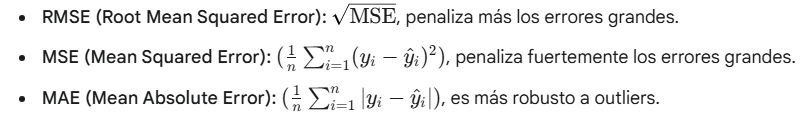

Dado que en los ejemplos de código siguientes se usa refit='rmse', podemos mantener RMSE (neg_mean_squared_error con squared=False) como la métrica principal para la optimización de GridSearchCV o RandomizedSearchCV, ya que penaliza los errores grandes, lo cual es útil en muchos problemas de regresión. Sin embargo, también es válido usar MAE o MSE. Para este análisis,  buscamos minimizar alguna de estas métricas de error.

Explicación de MAPE (Mean Absolute Percentage Error):
MAPE significa Error Porcentual Absoluto Medio. Es una métrica de evaluación del rendimiento de modelos de pronóstico o regresión que expresa la precisión como un porcentaje.

Fórmula:


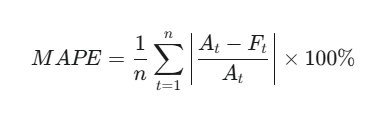

Donde:



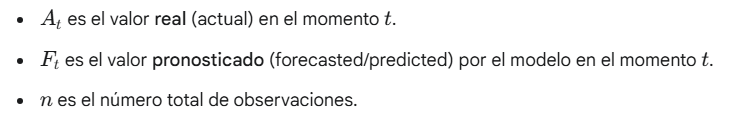

Interpretación:

El MAPE te indica el tamaño del error de tus predicciones en relación con los valores reales, expresado como un porcentaje.
Por ejemplo:

Un MAPE de 5% significa que, en promedio, las predicciones del modelo se desvían en un 5% de los valores reales.

Un MAPE de 100% significa que, en promedio, el error es tan grande como el valor real, lo que indica un pronóstico muy pobre.

Se trabaje el MAPE a partir del segundo bloque

#   PRIMER BLOQUE:
#   • LinearRegresor
#   • Lasso
#   • ElasticNet

## Justificación de Hiperparámetros y Rangos de Búsqueda por Algoritmo (Bloque 1)

### 1. LinearRegression

#### **Características del modelo**
LinearRegression no tiene hiperparámetros ajustables en `GridSearchCV` o `RandomizedSearchCV` en su implementación estándar de `scikit-learn`.  
Es un modelo paramétrico que resuelve el problema de mínimos cuadrados de forma **analítica**.

#### **Consideraciones**
Dado que no hay hiperparámetros que optimizar, cualquier ajuste del modelo se realiza en **etapas previas**, como:
- **Escalado de características** (`StandardScaler`).
- **Codificación de variables categóricas** (`OneHotEncoder` o `OrdinalEncoder`).
- **Eliminación de valores atípicos o transformación de datos**.

#### **Score a minimizar**
- **RMSE** (Raíz del Error Cuadrático Medio)
- **MAE** (Error Absoluto Medio)
- **MSE** (Error Cuadrático Medio)

---

### 2. Lasso (L1 Regularization)

#### **Hiperparámetros a buscar**
- **`alpha`**: Controla la fuerza de regularización (`lambda`).  
  - Un valor más alto **impone una penalización más fuerte**, forzando algunos coeficientes a cero (**selección de características**).
  - Si `alpha` es demasiado pequeño, el modelo se comporta como **regresión lineal** estándar.
  - Si `alpha` es demasiado grande, el modelo puede **subajustar**.

#### **Rejilla/Cotas de valores**
- **`lasso__alpha`**: `[0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100]` (escala logarítmica).  
  - Se requiere un rango amplio porque la **regularización afecta drásticamente el modelo**.

#### **Score a minimizar**
- **RMSE** (Raíz del Error Cuadrático Medio)
- **MSE** (Error Cuadrático Medio)
- **MAE** (Error Absoluto Medio)

---

### 3. ElasticNet (L1 + L2 Regularization)

#### **Hiperparámetros a buscar**
- **`alpha`**: Fuerza de regularización total (*como en Lasso y Ridge*).
- **`l1_ratio`**: Mezcla entre **regularización L1 y L2**.
  - Si `l1_ratio = 1`, el modelo se comporta como **Lasso**.
  - Si `l1_ratio = 0`, el modelo se comporta como **Ridge**.

#### **Justificación**
ElasticNet combina las ventajas de **Lasso** (selección de características) y **Ridge** (estabilidad).  
- `alpha` controla la fuerza total de la penalización.  
- `l1_ratio` controla la proporción **L1 vs. L2**, buscando un equilibrio adecuado.

#### **Rejilla/Cotas de valores**
- **`elasticnet__alpha`**: `[0.0001, 0.001, 0.01, 0.1, 1, 10, 100]` (escala logarítmica).  
  - Se necesita un **rango amplio**, ya que afecta significativamente el ajuste del modelo.
- **`elasticnet__l1_ratio`**: `[0.1, 0.3, 0.5, 0.7, 0.9, 0.95, 0.99, 1.0]` (valores entre 0 y 1).  
  - Valores cercanos a **0** o **1** exploran el comportamiento de **Ridge** y **Lasso**, respectivamente.

#### **Score a minimizar**
- **RMSE** (Raíz del Error Cuadrático Medio)
- **MSE** (Error Cuadrático Medio)
- **MAE** (Error Absoluto Medio)

##**GRIDSEARCH**

### PIPE LINE GRIDSEARCH

In [ ]:
# --- Definición de los Pipelines base para GridSearchCV ---
# Estos pipelines se usarán en GridSearchCV.

pipeline_lr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    ('regresion_lineal', LinearRegression())
])

pipeline_lasso = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    ('lasso', Lasso(random_state=42, max_iter=10000))
])

pipeline_elasticnet = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    ('elasticnet', ElasticNet(random_state=42, max_iter=10000))
])



# --- Esquemas de validación cruzada ---
cv_standard = KFold(n_splits=5, shuffle=True, random_state=42) # Para modelos rápidos

# --- Diccionario de modelos y sus parámetros para GridSearchCV ---
# Separamos los modelos en dos grupos para aplicar diferentes estrategias de CV
models_and_params_standard = {
    "LinearRegression": {
        "pipeline": pipeline_lr,
        "param_grid": {},
        "cv_folds": cv_standard,
        "data_fraction": 1.0 # Usar todos los datos
    },
    "Lasso": {
        "pipeline": pipeline_lasso,
        "param_grid": {
            'lasso__alpha': [0.00001, 0.0001, 0.001, 0.01, 0.1]
        },
        "cv_folds": cv_standard,
        "data_fraction": 1.0
    },
    "ElasticNet": {
        "pipeline": pipeline_elasticnet,
        "param_grid": {
            'elasticnet__alpha': [0.01, 0.1, 1.0, 10.0],
            'elasticnet__l1_ratio': [0.1, 0.5, 0.7, 0.9]
        },
        "cv_folds": cv_standard,
        "data_fraction": 1.0
    }
}


best_estimators = {}
results_cv_grid = {}
final_test_results = {}
y_preds_for_plot = {}

# Definir métricas de scoring para GridSearchCV
scoring_metrics = {
    'rmse': make_scorer(mean_squared_error, greater_is_better=False, squared=False),
    'r2': 'r2'
}

# --- Modificación aquí: Definir métricas de scoring para GridSearchCV ---
# Agregamos MAE y MSE explícitamente. MAPE no se usa directamente en GridSearchCV
# de esta forma porque requiere un manejo especial para valores cero.
scoring_metrics = {
    'rmse': make_scorer(mean_squared_error, greater_is_better=False, squared=False),
    'r2': 'r2',
    'mae': make_scorer(mean_absolute_error, greater_is_better=False), # MAE
    'mse': make_scorer(mean_squared_error, greater_is_better=False)  # MSE
}

print("--- Optimizando y Evaluando Modelos con GridSearchCV ---")

# --- Procesar Modelos Estándar ---
print("\n--- Procesando Modelos Estándar (LinearRegression, Lasso, ElasticNet) ---")
for name, config in models_and_params_standard.items():
    print(f"\nProcesando {name}...")
    model_pipeline = config["pipeline"]
    param_grid = config["param_grid"]
    current_cv = config["cv_folds"]

    if param_grid:
        grid_search = GridSearchCV(
            estimator=model_pipeline,
            param_grid=param_grid,
            cv=current_cv,
            scoring=scoring_metrics,
            refit='rmse', # Mantener refit en RMSE o la métrica que consideres principal para seleccionar el mejor modelo
            n_jobs=-1,
            verbose=1,
            return_train_score=True
        )

        print(f"   Buscando los mejores hiperparámetros para {name}...")
        grid_search.fit(Xtrain, ytrain) # Usamos todo Xtrain para estos modelos

        best_estimator = grid_search.best_estimator_
        best_params = grid_search.best_params_
        best_score_rmse = -grid_search.best_score_ # RMSE es negativo por make_scorer(..., greater_is_better=False)

        # --- Modificación aquí: Obtener los mejores scores para MAE, MSE y R2 del CV ---
        best_score_r2 = grid_search.cv_results_['mean_test_r2'][grid_search.best_index_]
        best_score_mae = -grid_search.cv_results_['mean_test_mae'][grid_search.best_index_]
        best_score_mse = -grid_search.cv_results_['mean_test_mse'][grid_search.best_index_]


        print(f"   Mejores parámetros para {name}: {best_params}")
        print(f"   RMSE (CV - Mejor): {best_score_rmse:.3f}")
        print(f"   R2 (CV - Mejor):   {best_score_r2:.3f}")
        print(f"   MAE (CV - Mejor):  {best_score_mae:.3f}") # Imprimir MAE
        print(f"   MSE (CV - Mejor):  {best_score_mse:.3f}") # Imprimir MSE

        best_estimators[name] = best_estimator
        results_cv_grid[name] = {
            'Best_Params': best_params,
            'RMSE_CV_best': best_score_rmse,
            'R2_CV_best': best_score_r2,
            'MAE_CV_best': best_score_mae, # Guardar MAE
            'MSE_CV_best': best_score_mse  # Guardar MSE
        }

    else: # Para LinearRegression (sin param_grid)
        print(f"   {name} no tiene hiperparámetros para tunear. Entrenando y evaluando directamente con CV...")
        rmse_scores = np.sqrt(-cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='neg_mean_squared_error', n_jobs=-1))
        r2_scores = cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='r2', n_jobs=-1)
        # --- Modificación aquí: Calcular MAE y MSE para LinearRegression con CV ---
        mae_scores = -cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='neg_mean_absolute_error', n_jobs=-1)
        mse_scores = -cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='neg_mean_squared_error', n_jobs=-1)


        best_estimator = model_pipeline
        best_estimators[name] = best_estimator
        results_cv_grid[name] = {
            'RMSE_CV_mean': rmse_scores.mean(),
            'RMSE_CV_std': rmse_scores.std(),
            'R2_CV_mean': r2_scores.mean(),
            'R2_CV_std': r2_scores.std(),
            'MAE_CV_mean': mae_scores.mean(), # Guardar MAE media
            'MAE_CV_std': mae_scores.std(),   # Guardar MAE desviación estándar
            'MSE_CV_mean': mse_scores.mean(), # Guardar MSE media
            'MSE_CV_std': mse_scores.std()    # Guardar MSE desviación estándar
        }
        print(f"   RMSE (Cross-Validation): {results_cv_grid[name]['RMSE_CV_mean']:.3f} +/- {results_cv_grid[name]['RMSE_CV_std']:.3f}")
        print(f"   R2 (Cross-Validation):   {results_cv_grid[name]['R2_CV_mean']:.3f} +/- {results_cv_grid[name]['R2_CV_std']:.3f}")
        print(f"   MAE (Cross-Validation):  {results_cv_grid[name]['MAE_CV_mean']:.3f} +/- {results_cv_grid[name]['MAE_CV_std']:.3f}")
        print(f"   MSE (Cross-Validation):  {results_cv_grid[name]['MSE_CV_mean']:.3f} +/- {results_cv_grid[name]['MSE_CV_std']:.3f}")

    # Evaluación en el Test Set
    print(f"   Evaluando {name} en el Test Set...")
    # Entrenar el mejor estimador en todo Xtrain si no lo hizo GridSearchCV (caso LinearRegression)
    if not param_grid:
        best_estimator.fit(Xtrain, ytrain)

    y_pred_test = best_estimator.predict(Xtest)
    y_preds_for_plot[name] = y_pred_test

    mse_test = mean_squared_error(ytest, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(ytest, y_pred_test)
    # --- Modificación aquí: Calcular MAE y MAPE en el Test Set ---
    mae_test = mean_absolute_error(ytest, y_pred_test)
    # MAPE puede generar errores si ytest tiene valores cero.
    # Se añade un pequeño epsilon para evitar división por cero.
    mape_test = np.mean(np.abs((ytest - y_pred_test) / ytest)) * 100
    # Opcional: una versión más robusta de MAPE que maneja ceros o valores muy pequeños
    # from sklearn.utils import check_array
    # def mean_absolute_percentage_error_robust(y_true, y_pred):
    #     y_true, y_pred = check_array(y_true), check_array(y_pred)
    #     # Reemplazar ceros en y_true con un valor pequeño (epsilon) para evitar división por cero
    #     epsilon = np.finfo(np.float64).eps
    #     return np.mean(np.abs((y_true - y_pred) / np.maximum(np.abs(y_true), epsilon))) * 100

    # mape_test = mean_absolute_percentage_error_robust(ytest, y_pred_test)


    final_test_results[name] = {
        'RMSE_Test': rmse_test,
        'R2_Test': r2_test,
        'MAE_Test': mae_test,  # Guardar MAE en test
        'MSE_Test': mse_test,  # Guardar MSE en test
        'MAPE_Test': mape_test # Guardar MAPE en test
    }
    print(f"   RMSE (Test Set): {final_test_results[name]['RMSE_Test']:.3f}")
    print(f"   R2 (Test Set):   {final_test_results[name]['R2_Test']:.3f}")
    print(f"   MAE (Test Set):  {final_test_results[name]['MAE_Test']:.3f}") # Imprimir MAE
    print(f"   MSE (Test Set):  {final_test_results[name]['MSE_Test']:.3f}") # Imprimir MSE
    print(f"   MAPE (Test Set): {final_test_results[name]['MAPE_Test']:.3f}%") # Imprimir MAPE




--- Optimizando y Evaluando Modelos con GridSearchCV ---

--- Procesando Modelos Estándar (LinearRegression, Lasso, ElasticNet) ---

Procesando LinearRegression...
   LinearRegression no tiene hiperparámetros para tunear. Entrenando y evaluando directamente con CV...
   RMSE (Cross-Validation): 27882.109 +/- 3219.124
   R2 (Cross-Validation):   0.884 +/- 0.020
   MAE (Cross-Validation):  17639.049 +/- 594.368
   MSE (Cross-Validation):  787774746.617 +/- 183512131.376
   Evaluando LinearRegression en el Test Set...
   RMSE (Test Set): 37406.704
   R2 (Test Set):   0.746
   MAE (Test Set):  18235.543
   MSE (Test Set):  1399261503.275
   MAPE (Test Set): 12.083%

Procesando Lasso...
   Buscando los mejores hiperparámetros para Lasso...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
   Mejores parámetros para Lasso: {'lasso__alpha': 1e-05}
   RMSE (CV - Mejor): nan
   R2 (CV - Mejor):   0.883
   MAE (CV - Mejor):  17641.524
   MSE (CV - Mejor):  788258373.073
   Evaluando La

### GUARDADO DE GRIDSEARCH

In [ ]:
# Define la misma ruta base en Drive donde guardas Xtest y ytest
# Asegúrate de que esta ruta sea accesible desde Colab
DRIVE_OUTPUT_PATH = '/content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA' # <-- Nueva carpeta para resultados

# Crea la carpeta si no existe
os.makedirs(DRIVE_OUTPUT_PATH, exist_ok=True)
print(f"Directorio de resultados creado: {DRIVE_OUTPUT_PATH}")

# Define la etiqueta que quieres añadir a los nombres de los archivos
# Puedes cambiar esto a 'RandomizedSearch' o cualquier otra cosa si el contexto es diferente
search_tag = "GridSearch"

# --- Guardar resultados de final_test_results ---
if final_test_results:
    final_results_df = pd.DataFrame.from_dict(final_test_results, orient='index')
    # Añade la etiqueta al nombre del archivo
    final_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'final_test_results_{search_tag}.csv')
    final_results_df.to_csv(final_results_csv_path, index=True)
    print(f"Resultados de test ({search_tag}) guardados en: {final_results_csv_path}")
else:
    print("No hay resultados de test para guardar.")


# --- Guardar resultados de results_cv_grid ---
if results_cv_grid:
    cv_results_list = []
    for model_name, metrics in results_cv_grid.items():
        row = {'Model': model_name}
        for key, value in metrics.items():
            if isinstance(value, dict): # Para Best_Params
                for param_key, param_value in value.items():
                    row[f'Param_{param_key}'] = param_value
            else:
                row[key] = value
        cv_results_list.append(row)

    if cv_results_list:
        cv_results_df = pd.DataFrame(cv_results_list)
        # Añade la etiqueta al nombre del archivo
        cv_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'cv_grid_results_{search_tag}.csv')
        cv_results_df.to_csv(cv_results_csv_path, index=False)
        print(f"Resultados de CV ({search_tag}) guardados en: {cv_results_csv_path}")
    else:
        print("No hay resultados de CV para guardar.")
else:
    print("No hay resultados de CV para guardar.")

Directorio de resultados creado: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA
Resultados de test (GridSearch) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/final_test_results_GridSearch.csv
Resultados de CV (GridSearch) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/cv_grid_results_GridSearch.csv


### VISUALIZACION DE GRIDSEARCH:


--- Generando Gráficas de Dispersión en Test Set ---


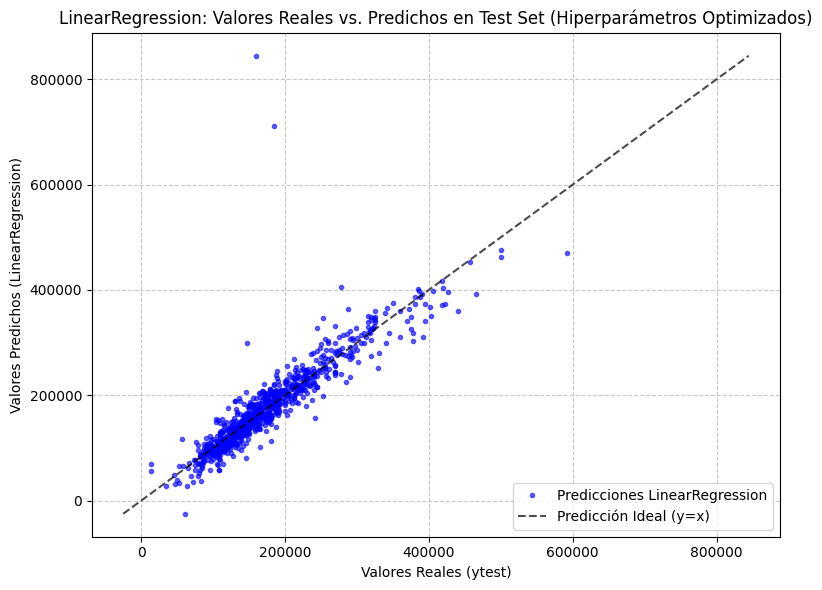

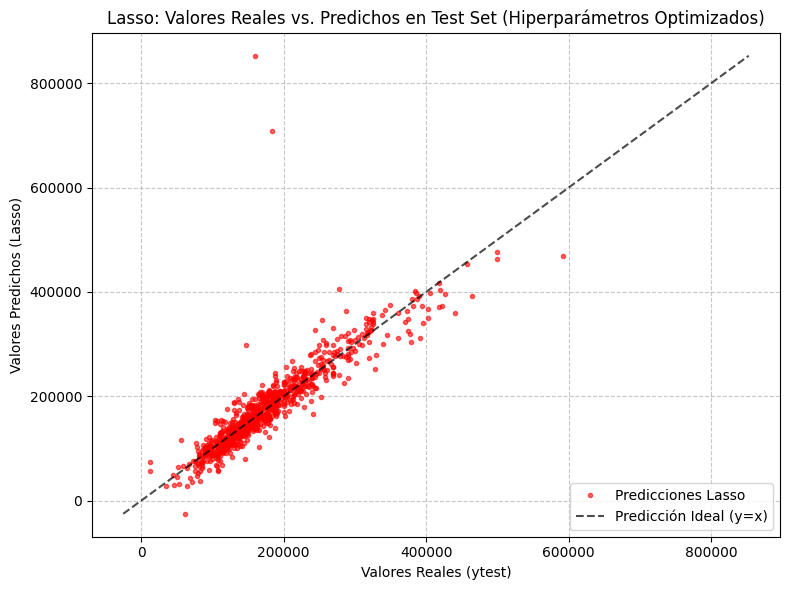

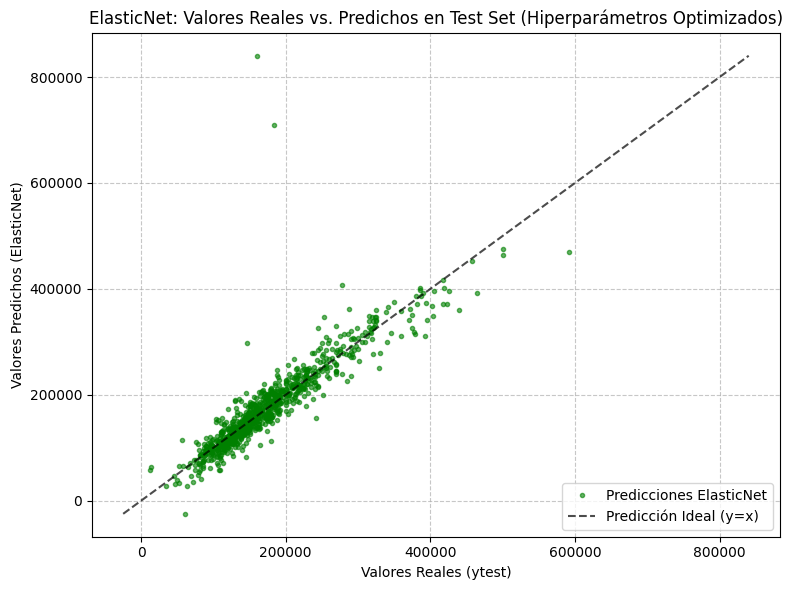


--- Resumen Comparativo de Rendimiento ---
Rendimiento en Validación Cruzada (Mejor RMSE y R2 con Hiperparámetros Optimizados):
   LinearRegression: RMSE = 27882.109 +/- 3219.124, R2 = 0.884 +/- 0.020
   Lasso: RMSE = nan, R2 = 0.883 (Parámetros: {'lasso__alpha': 1e-05})
   ElasticNet: RMSE = nan, R2 = 0.885 (Parámetros: {'elasticnet__alpha': 0.01, 'elasticnet__l1_ratio': 0.1})

Rendimiento Final en el Conjunto de Test (RMSE, R2, MAE, MSE y MAPE):
   LinearRegression: RMSE = 37406.704, R2 = 0.746, MAE = 18235.543, MSE = 1399261503.275, MAPE = 12.083%
   Lasso: RMSE = 37520.523, R2 = 0.744, MAE = 18236.407, MSE = 1407789644.071, MAPE = 12.134%
   ElasticNet: RMSE = 37144.169, R2 = 0.749, MAE = 18027.607, MSE = 1379689262.213, MAPE = 11.898%
Predicciones (GridSearch) guardadas en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/y_preds_for_plot_GridSearch.pkl


In [ ]:
# --- Generación de las gráficas de dispersión para todos los modelos ---
colors = {
    "LinearRegression": "blue",
    "Lasso": "red",
    "ElasticNet": "green",
    "KernelRidge": "purple",
    "SGDRegressor": "orange",
    "BayesianRidge": "brown",
    # Agrega colores para los modelos restantes si los incluyes en y_preds_for_plot
    "GaussianProcessRegressor": "cyan",
    "RandomForestRegressor": "magenta",
    "SVR": "darkgray"
}

print("\n--- Generando Gráficas de Dispersión en Test Set ---")
for name, y_pred_test in y_preds_for_plot.items():
    plt.figure(figsize=(8, 6))
    plt.plot(ytest, y_pred_test, '.', alpha=0.6, color=colors.get(name, 'gray'), label=f'Predicciones {name}')
    plt.title(f'{name}: Valores Reales vs. Predichos en Test Set (Hiperparámetros Optimizados)')
    plt.xlabel('Valores Reales (ytest)')
    plt.ylabel(f'Valores Predichos ({name})')

    min_val = min(ytest.min(), y_pred_test.min())
    max_val = max(ytest.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.7, label='Predicción Ideal (y=x)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()



### Resumen Comparativo de Rendimiento


print("\n--- Resumen Comparativo de Rendimiento ---")
print("Rendimiento en Validación Cruzada (Mejor RMSE y R2 con Hiperparámetros Optimizados):")
for name, res in results_cv_grid.items():
    if 'Best_Params' in res:
        # Aquí también podrías añadir MAE y MSE si los quieres en el resumen de CV
        # Asegúrate de que las claves existan en `res` si los añadiste en el bloque anterior
        if 'RMSE_CV_best_subsample' in res: # Para el caso de submuestreo, si aplica
            print(f"   {name}: RMSE = {res['RMSE_CV_best_subsample']:.3f}, R2 = {res['R2_CV_best_subsample']:.3f} (Parámetros: {res['Best_Params']}) [Submuestra de CV]")
        else:
            print(f"   {name}: RMSE = {res['RMSE_CV_best']:.3f}, R2 = {res['R2_CV_best']:.3f} (Parámetros: {res['Best_Params']})")
    else: # Para LinearRegression (sin param_grid, usa medias y desviaciones)
        print(f"   {name}: RMSE = {res['RMSE_CV_mean']:.3f} +/- {res['RMSE_CV_std']:.3f}, R2 = {res['R2_CV_mean']:.3f} +/- {res['R2_CV_std']:.3f}")


print("\nRendimiento Final en el Conjunto de Test (RMSE, R2, MAE, MSE y MAPE):")
for name, res in final_test_results.items():
    # Asegúrate de que las claves existan antes de intentar imprimirlas
    rmse_str = f"RMSE = {res['RMSE_Test']:.3f}" if 'RMSE_Test' in res else ""
    r2_str = f"R2 = {res['R2_Test']:.3f}" if 'R2_Test' in res else ""
    mae_str = f"MAE = {res['MAE_Test']:.3f}" if 'MAE_Test' in res else ""
    mse_str = f"MSE = {res['MSE_Test']:.3f}" if 'MSE_Test' in res else ""
    mape_str = f"MAPE = {res['MAPE_Test']:.3f}%" if 'MAPE_Test' in res else ""

    # Imprime todas las métricas disponibles en una línea para cada modelo
    print(f"   {name}: {rmse_str}, {r2_str}, {mae_str}, {mse_str}, {mape_str}")



# --- Guardar y_preds_for_plot (las predicciones) ---
if y_preds_for_plot:
    # Si 'search_tag' está definida en un ámbito superior (como en las respuestas anteriores),
    # puedes usarla aquí. Si no, defínela aquí si solo guardas este archivo con una etiqueta fija.
    # Por ejemplo, si este es el resultado de una corrida general o de tu mejor búsqueda:
    search_tag = "GridSearch" # O "GridSearch", "RandomizedSearch", etc., según tu preferencia.

    # Guardar las predicciones. Como es un diccionario de arrays, pickle es el mejor.
    # Añade la etiqueta al nombre del archivo
    y_preds_pickle_path = os.path.join(DRIVE_OUTPUT_PATH, f'y_preds_for_plot_{search_tag}.pkl')
    with open(y_preds_pickle_path, 'wb') as f:
        pickle.dump(y_preds_for_plot, f)
    print(f"Predicciones ({search_tag}) guardadas en: {y_preds_pickle_path}")
else:
    print("No hay predicciones para guardar.")

## **RANDOMSEARCH**

### PIPE LINE RANDOMSEARCH

In [ ]:


print("--- Optimizando y Evaluando Modelos con RandomizedSearchCV ---")

print("\n--- Procesando Modelos Estándar (LinearRegression, Lasso, ElasticNet) ---")
for name, config in models_and_params_standard.items():
    print(f"\nProcesando {name}...")
    model_pipeline = config["pipeline"]
    param_grid = config["param_grid"]
    current_cv = config["cv_folds"]

    if param_grid:
        random_search = RandomizedSearchCV(
            estimator=model_pipeline,
            param_distributions=param_grid,  # Se usa param_distributions en lugar de param_grid
            cv=current_cv,
            scoring=scoring_metrics,
            refit='rmse',
            n_jobs=-1,
            verbose=1,
            return_train_score=True,
            n_iter=20,  # Número de combinaciones aleatorias a evaluar (ajusta según rendimiento)
            random_state=42
        )

        print(f"  Buscando los mejores hiperparámetros para {name}...")
        random_search.fit(Xtrain, ytrain)

        best_estimator = random_search.best_estimator_
        best_params = random_search.best_params_
        best_score_rmse = -random_search.best_score_
        best_score_r2 = random_search.cv_results_['mean_test_r2'][random_search.best_index_]

        print(f"  Mejores parámetros para {name}: {best_params}")
        print(f"  RMSE (CV - Mejor): {best_score_rmse:.3f}")
        print(f"  R2 (CV - Mejor):   {best_score_r2:.3f}")

        best_estimators[name] = best_estimator
        results_cv_grid[name] = {
            'Best_Params': best_params,
            'RMSE_CV_best': best_score_rmse,
            'R2_CV_best': best_score_r2
        }

    else:  # Para LinearRegression (sin búsqueda de hiperparámetros)
        print(f"  {name} no tiene hiperparámetros para tunear. Entrenando y evaluando directamente con CV...")
        rmse_scores = np.sqrt(-cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='neg_mean_squared_error', n_jobs=-1))
        r2_scores = cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='r2', n_jobs=-1)

        best_estimator = model_pipeline
        best_estimators[name] = best_estimator
        results_cv_grid[name] = {
            'RMSE_CV_mean': rmse_scores.mean(),
            'RMSE_CV_std': rmse_scores.std(),
            'R2_CV_mean': r2_scores.mean(),
            'R2_CV_std': r2_scores.std()
        }
        print(f"  RMSE (Cross-Validation): {results_cv_grid[name]['RMSE_CV_mean']:.3f} +/- {results_cv_grid[name]['RMSE_CV_std']:.3f}")
        print(f"  R2 (Cross-Validation):   {results_cv_grid[name]['R2_CV_mean']:.3f} +/- {results_cv_grid[name]['R2_CV_std']:.3f}")

    # Evaluación en el Test Set
    print(f"  Evaluando {name} en el Test Set...")
    if not param_grid:
        best_estimator.fit(Xtrain, ytrain)

    y_pred_test = best_estimator.predict(Xtest)
    y_preds_for_plot[name] = y_pred_test

    mse_test = mean_squared_error(ytest, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(ytest, y_pred_test)

    final_test_results[name] = {
        'RMSE_Test': rmse_test,
        'R2_Test': r2_test
    }
    print(f"  RMSE (Test Set): {final_test_results[name]['RMSE_Test']:.3f}")
    print(f"  R2 (Test Set):   {final_test_results[name]['R2_Test']:.3f}")

--- Optimizando y Evaluando Modelos con RandomizedSearchCV ---

--- Procesando Modelos Estándar (LinearRegression, Lasso, ElasticNet) ---

Procesando LinearRegression...
  LinearRegression no tiene hiperparámetros para tunear. Entrenando y evaluando directamente con CV...
  RMSE (Cross-Validation): 27882.109 +/- 3219.124
  R2 (Cross-Validation):   0.884 +/- 0.020
  Evaluando LinearRegression en el Test Set...
  RMSE (Test Set): 37406.704
  R2 (Test Set):   0.746

Procesando Lasso...
  Buscando los mejores hiperparámetros para Lasso...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
  Mejores parámetros para Lasso: {'lasso__alpha': 1e-05}
  RMSE (CV - Mejor): nan
  R2 (CV - Mejor):   0.883
  Evaluando Lasso en el Test Set...
  RMSE (Test Set): 37520.523
  R2 (Test Set):   0.744

Procesando ElasticNet...
  Buscando los mejores hiperparámetros para ElasticNet...
Fitting 5 folds for each of 16 candidates, totalling 80 fits
  Mejores parámetros para ElasticNet: {'elasticnet__l1_

### GUARDADO RANDOMSEARCH



In [ ]:
# Define la misma ruta base en Drive donde guardas Xtest y ytest
# Asegúrate de que esta ruta sea accesible desde Colab
DRIVE_OUTPUT_PATH = '/content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA' # <-- Nueva carpeta para resultados

# Crea la carpeta si no existe
os.makedirs(DRIVE_OUTPUT_PATH, exist_ok=True)
print(f"Directorio de resultados creado: {DRIVE_OUTPUT_PATH}")

# Define la etiqueta que quieres añadir a los nombres de los archivos
# Puedes cambiar esto a 'RandomizedSearch' o cualquier otra cosa si el contexto es diferente
search_tag = "RandomizedSearch"

# --- Guardar resultados de final_test_results ---
if final_test_results:
    final_results_df = pd.DataFrame.from_dict(final_test_results, orient='index')
    # Añade la etiqueta al nombre del archivo
    final_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'final_test_results_{search_tag}.csv')
    final_results_df.to_csv(final_results_csv_path, index=True)
    print(f"Resultados de test ({search_tag}) guardados en: {final_results_csv_path}")
else:
    print("No hay resultados de test para guardar.")


# --- Guardar resultados de results_cv_grid ---
if results_cv_grid:
    cv_results_list = []
    for model_name, metrics in results_cv_grid.items():
        row = {'Model': model_name}
        for key, value in metrics.items():
            if isinstance(value, dict): # Para Best_Params
                for param_key, param_value in value.items():
                    row[f'Param_{param_key}'] = param_value
            else:
                row[key] = value
        cv_results_list.append(row)

    if cv_results_list:
        cv_results_df = pd.DataFrame(cv_results_list)
        # Añade la etiqueta al nombre del archivo
        cv_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'cv_grid_results_{search_tag}.csv')
        cv_results_df.to_csv(cv_results_csv_path, index=False)
        print(f"Resultados de CV ({search_tag}) guardados en: {cv_results_csv_path}")
    else:
        print("No hay resultados de CV para guardar.")
else:
    print("No hay resultados de CV para guardar.")

Directorio de resultados creado: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA
Resultados de test (RandomizedSearch) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/final_test_results_RandomizedSearch.csv
Resultados de CV (RandomizedSearch) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/cv_grid_results_RandomizedSearch.csv


### VISUALIZACIÓN RANDOMSEARCH


--- Generando Gráficas de Dispersión en Test Set ---


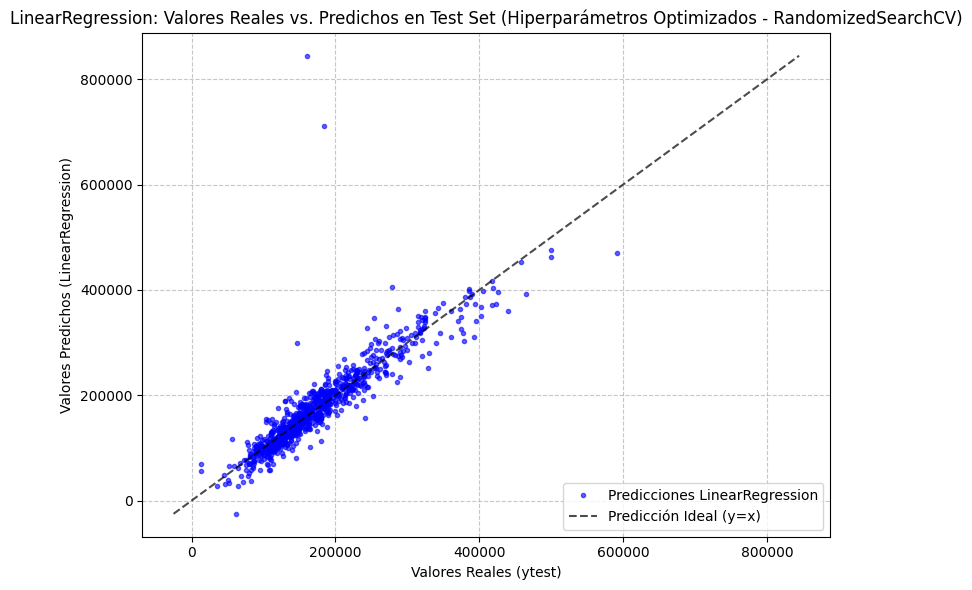

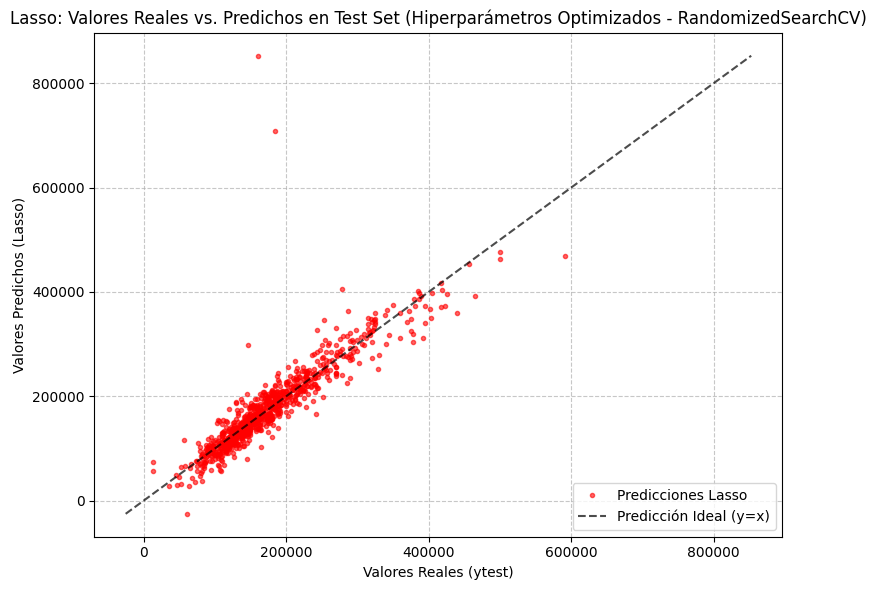

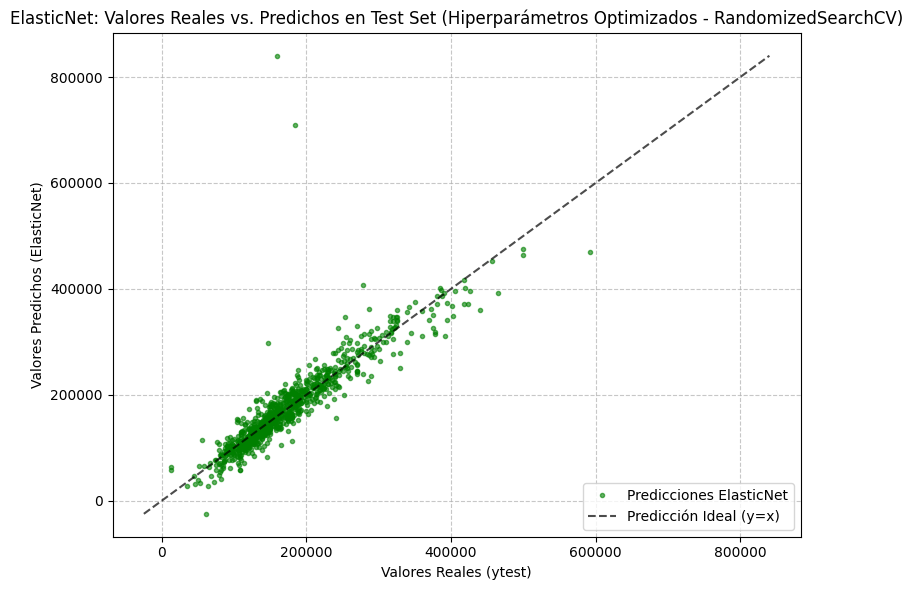


--- Resumen Comparativo de Rendimiento ---
Rendimiento en Validación Cruzada (Mejor RMSE y R2 con Hiperparámetros Optimizados - RandomizedSearchCV):
  LinearRegression: RMSE = 27882.109 +/- 3219.124, R2 = 0.884 +/- 0.020
  Lasso: RMSE = nan, R2 = 0.883 (Parámetros: {'lasso__alpha': 1e-05})
  ElasticNet: RMSE = nan, R2 = 0.885 (Parámetros: {'elasticnet__l1_ratio': 0.1, 'elasticnet__alpha': 0.01})

Rendimiento Final en el Conjunto de Test (RMSE y R2):
  LinearRegression: RMSE = 37406.704, R2 = 0.746
  Lasso: RMSE = 37520.523, R2 = 0.744
  ElasticNet: RMSE = 37144.169, R2 = 0.749
Predicciones (RandomizedSearch) guardadas en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/y_preds_for_plot_RandomizedSearch.pkl


In [ ]:
# Colores para cada modelo
colors = {
    "LinearRegression": "blue",
    "Lasso": "red",
    "ElasticNet": "green"
}
# Filtrar solo los modelos trabajados
modelos_trabajados = {"LinearRegression", "Lasso", "ElasticNet"}
y_preds_for_plot = {k: v for k, v in y_preds_for_plot.items() if k in modelos_trabajados}

print("\n--- Generando Gráficas de Dispersión en Test Set ---")
for name, y_pred_test in y_preds_for_plot.items():
    plt.figure(figsize=(8, 6))
    plt.plot(ytest, y_pred_test, '.', alpha=0.6, color=colors.get(name, 'gray'), label=f'Predicciones {name}')
    plt.title(f'{name}: Valores Reales vs. Predichos en Test Set (Hiperparámetros Optimizados - RandomizedSearchCV)')
    plt.xlabel('Valores Reales (ytest)')
    plt.ylabel(f'Valores Predichos ({name})')

    min_val = min(ytest.min(), y_pred_test.min())
    max_val = max(ytest.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.7, label='Predicción Ideal (y=x)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n--- Resumen Comparativo de Rendimiento ---")
print("Rendimiento en Validación Cruzada (Mejor RMSE y R2 con Hiperparámetros Optimizados - RandomizedSearchCV):")
for name, res in results_cv_grid.items():
    if 'Best_Params' in res:
        # Check if the results are from a subsample or full CV
        if 'RMSE_CV_best_subsample' in res:
             print(f"  {name}: RMSE = {res['RMSE_CV_best_subsample']:.3f}, R2 = {res['R2_CV_best_subsample']:.3f} (Parámetros: {res['Best_Params']}) [Submuestra de CV]")
        else:
            print(f"  {name}: RMSE = {res['RMSE_CV_best']:.3f}, R2 = {res['R2_CV_best']:.3f} (Parámetros: {res['Best_Params']})")
    else:
        print(f"  {name}: RMSE = {res['RMSE_CV_mean']:.3f} +/- {res['RMSE_CV_std']:.3f}, R2 = {res['R2_CV_mean']:.3f} +/- {res['R2_CV_std']:.3f}")


print("\nRendimiento Final en el Conjunto de Test (RMSE y R2):")
for name, res in final_test_results.items():
    print(f"  {name}: RMSE = {res['RMSE_Test']:.3f}, R2 = {res['R2_Test']:.3f}")


# --- Guardar y_preds_for_plot (las predicciones) ---
if y_preds_for_plot:
    # Si 'search_tag' está definida en un ámbito superior (como en las respuestas anteriores),
    # puedes usarla aquí. Si no, defínela aquí si solo guardas este archivo con una etiqueta fija.
    # Por ejemplo, si este es el resultado de una corrida general o de tu mejor búsqueda:
    search_tag = "RandomizedSearch" # O "GridSearch", "RandomizedSearch", etc., según tu preferencia.

    # Guardar las predicciones. Como es un diccionario de arrays, pickle es el mejor.
    # Añade la etiqueta al nombre del archivo
    y_preds_pickle_path = os.path.join(DRIVE_OUTPUT_PATH, f'y_preds_for_plot_{search_tag}.pkl')
    with open(y_preds_pickle_path, 'wb') as f:
        pickle.dump(y_preds_for_plot, f)
    print(f"Predicciones ({search_tag}) guardadas en: {y_preds_pickle_path}")
else:
    print("No hay predicciones para guardar.")

## **OPTIMIZACIÓN BAYESIANA**

### PIPE LINE

In [ ]:
# --- Definición de los modelos y sus espacios de búsqueda de parámetros ---
# ¡AQUÍ ES DONDE DEBES ASEGURARTE DE USAR 'param_space' EN LUGAR DE 'param_grid'!
models_and_params_standard = {
    "LinearRegression": {
        # Added the mypre_houses preprocessing step to the pipeline
        "pipeline": Pipeline([('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)), ('scaler', StandardScaler()), ('regressor', LinearRegression())]),
        "param_space": None, # No hay hiperparámetros para tunear en LinearRegression
        "cv_folds": 5
    },
    "Lasso": {
        # Added the mypre_houses preprocessing step to the pipeline
        "pipeline": Pipeline([('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)), ('scaler', StandardScaler()), ('regressor', Lasso(random_state=42))]),
        "param_space": {
            'regressor__alpha': Real(0.00001, 0.0001, prior='log-uniform') # Espacio para el parámetro 'alpha' de Lasso
        },
        "cv_folds": 4
    },
    "ElasticNet": {
        # Added the mypre_houses preprocessing step to the pipeline
        "pipeline": Pipeline([('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)), ('scaler', StandardScaler()), ('regressor', ElasticNet(random_state=42))]),
        "param_space": {
            'regressor__alpha': Real(0.01, 0.1, prior='log-uniform'), # Espacio para 'alpha'
            'regressor__l1_ratio': Real(0.1, 1.0, prior='uniform') # Espacio para 'l1_ratio'
        },
        "cv_folds": 4
    }
}

# Define scoring metrics for BayesSearchCV
scoring_metrics = {
    # Removed squared=False as it's deprecated/removed in recent sklearn versions
    'rmse': make_scorer(mean_squared_error, greater_is_better=False),
    'r2': 'r2'
}


print("--- Optimizando y Evaluando Modelos con Optimización Bayesiana (BayesSearchCV) ---")

best_estimators = {}
results_cv_bayes = {}
final_test_results = {}
y_preds_for_plot = {}

print("\n--- Procesando Modelos Estándar (LinearRegression, Lasso, ElasticNet) ---")
for name, config in models_and_params_standard.items():
    print(f"\nProcesando {name}...")
    model_pipeline = config["pipeline"]
    # ¡Asegúrate de que 'param_space' esté en tu diccionario 'config'!
    param_space = config["param_space"]
    current_cv = config["cv_folds"]

    if param_space:
        bayes_search = BayesSearchCV(
            estimator=model_pipeline,
            search_spaces=param_space,
            cv=current_cv,
            scoring=scoring_metrics,
            refit='rmse',
            n_jobs=-1,
            verbose=1,
            return_train_score=True,
            n_iter=50,
            random_state=42
        )

        print(f"   Buscando los mejores hiperparámetros para {name} usando optimización bayesiana...")
        bayes_search.fit(Xtrain, ytrain)

        best_estimator = bayes_search.best_estimator_
        best_params = bayes_search.best_params_
        # The target is the negative MSE mean from cross_val_score, so negate and take sqrt to get RMSE
        best_score_rmse = np.sqrt(-bayes_search.best_score_)
        best_score_r2 = bayes_search.cv_results_['mean_test_r2'][bayes_search.best_index_] # Added R2 retrieval

        print(f"   Mejores parámetros para {name}: {best_params}")
        print(f"   RMSE (CV - Mejor): {best_score_rmse:.3f}")
        print(f"   R2 (CV - Mejor):   {best_score_r2:.3f}") # Print R2

        best_estimators[name] = best_estimator
        results_cv_bayes[name] = {
            'Best_Params': best_params,
            'RMSE_CV_best': best_score_rmse,
            'R2_CV_best': best_score_r2 # Added R2 to results
        }

    else:
        print(f"   {name} no tiene hiperparámetros para tunear. Entrenando y evaluando directamente con CV...")
        # Calculate RMSE and R2 using cross_val_score
        rmse_scores = np.sqrt(-cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='neg_mean_squared_error', n_jobs=-1))
        r2_scores = cross_val_score(model_pipeline, Xtrain, ytrain, cv=current_cv, scoring='r2', n_jobs=-1)

        best_estimator = model_pipeline
        # Fit the non-tuned model on the full training data for test evaluation later
        best_estimator.fit(Xtrain, ytrain)

        best_estimators[name] = best_estimator
        results_cv_bayes[name] = {
            'RMSE_CV_mean': rmse_scores.mean(),
            'RMSE_CV_std': rmse_scores.std(),
            'R2_CV_mean': r2_scores.mean(),
            'R2_CV_std': r2_scores.std()
        }
        print(f"   RMSE (Cross-Validation): {results_cv_bayes[name]['RMSE_CV_mean']:.3f} +/- {results_cv_bayes[name]['RMSE_CV_std']:.3f}")
        print(f"   R2 (Cross-Validation):   {results_cv_bayes[name]['R2_CV_mean']:.3f} +/- {results_cv_bayes[name]['R2_CV_std']:.3f}")

    # Evaluation in the Test Set
    print(f"   Evaluating {name} on the Test Set...")
    # The best_estimator is already fitted on the full training data (either by BayesSearchCV or explicitly for non-tuned models)

    y_pred_test = best_estimator.predict(Xtest)
    y_preds_for_plot[name] = y_pred_test

    mse_test = mean_squared_error(ytest, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(ytest, y_pred_test)

    final_test_results[name] = {
        'RMSE_Test': rmse_test,
        'R2_Test': r2_test
    }
    print(f"   RMSE (Test Set): {final_test_results[name]['RMSE_Test']:.3f}")
    print(f"   R2 (Test Set):   {final_test_results[name]['R2_Test']:.3f}")

print("\n--- Optimización Bayesiana Completada ---")
print("\nResultados de CV con Optimización Bayesiana:", results_cv_bayes)
print("\nResultados Finales en Test Set:", final_test_results)

--- Optimizando y Evaluando Modelos con Optimización Bayesiana (BayesSearchCV) ---

--- Procesando Modelos Estándar (LinearRegression, Lasso, ElasticNet) ---

Procesando LinearRegression...
   LinearRegression no tiene hiperparámetros para tunear. Entrenando y evaluando directamente con CV...
   RMSE (Cross-Validation): 27814.648 +/- 2754.496
   R2 (Cross-Validation):   0.881 +/- 0.036
   Evaluating LinearRegression on the Test Set...
   RMSE (Test Set): 37406.704
   R2 (Test Set):   0.746

Procesando Lasso...
   Buscando los mejores hiperparámetros para Lasso usando optimización bayesiana...
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, tota

### GUARDADO DE OPTIMIZACION BAYESIANA


In [ ]:
# Define la misma ruta base en Drive donde guardas Xtest y ytest
# Asegúrate de que esta ruta sea accesible desde Colab
DRIVE_OUTPUT_PATH = '/content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA' # <-- Nueva carpeta para resultados

# Crea la carpeta si no existe
os.makedirs(DRIVE_OUTPUT_PATH, exist_ok=True)
print(f"Directorio de resultados creado: {DRIVE_OUTPUT_PATH}")

# Define la etiqueta que quieres añadir a los nombres de los archivos
# Puedes cambiar esto a 'RandomizedSearch' o cualquier otra cosa si el contexto es diferente
search_tag = "Bayessian"

# --- Guardar resultados de final_test_results ---
if final_test_results:
    final_results_df = pd.DataFrame.from_dict(final_test_results, orient='index')
    # Añade la etiqueta al nombre del archivo
    final_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'final_test_results_{search_tag}.csv')
    final_results_df.to_csv(final_results_csv_path, index=True)
    print(f"Resultados de test ({search_tag}) guardados en: {final_results_csv_path}")
else:
    print("No hay resultados de test para guardar.")


# --- Guardar resultados de results_cv_grid ---
if results_cv_grid:
    cv_results_list = []
    for model_name, metrics in results_cv_grid.items():
        row = {'Model': model_name}
        for key, value in metrics.items():
            if isinstance(value, dict): # Para Best_Params
                for param_key, param_value in value.items():
                    row[f'Param_{param_key}'] = param_value
            else:
                row[key] = value
        cv_results_list.append(row)

    if cv_results_list:
        cv_results_df = pd.DataFrame(cv_results_list)
        # Añade la etiqueta al nombre del archivo
        cv_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'cv_grid_results_{search_tag}.csv')
        cv_results_df.to_csv(cv_results_csv_path, index=False)
        print(f"Resultados de CV ({search_tag}) guardados en: {cv_results_csv_path}")
    else:
        print("No hay resultados de CV para guardar.")
else:
    print("No hay resultados de CV para guardar.")

Directorio de resultados creado: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA
Resultados de test (Bayessian) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/final_test_results_Bayessian.csv
Resultados de CV (Bayessian) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/cv_grid_results_Bayessian.csv


###VISUALIZACION OPTIMIZACION BAYESIANA


--- Generando Gráficas de Dispersión en Test Set ---


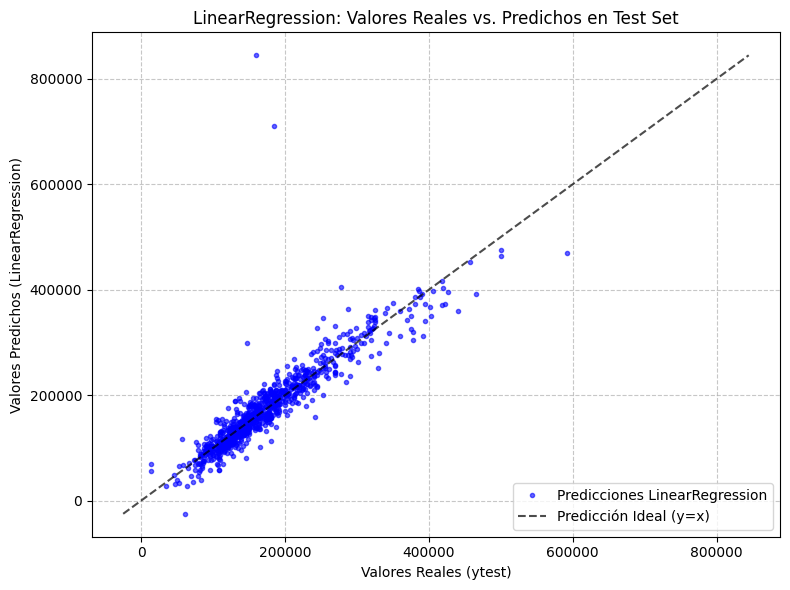

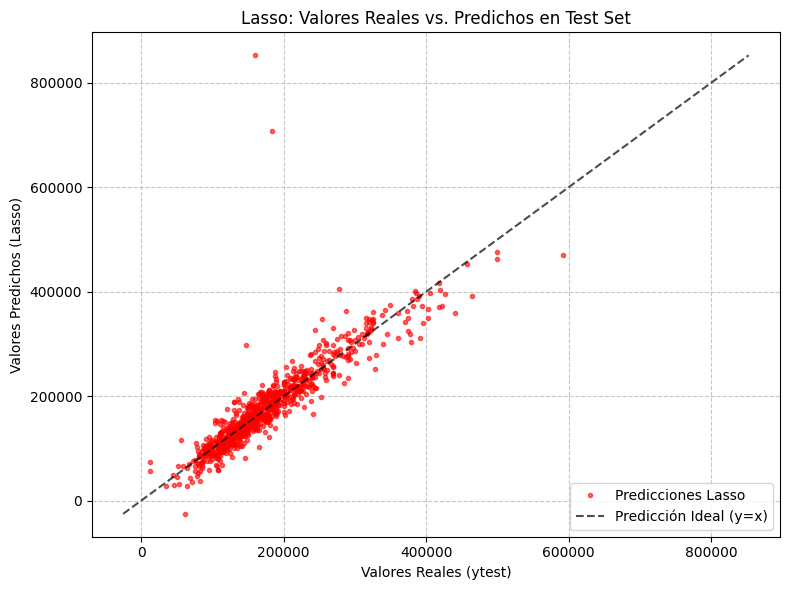

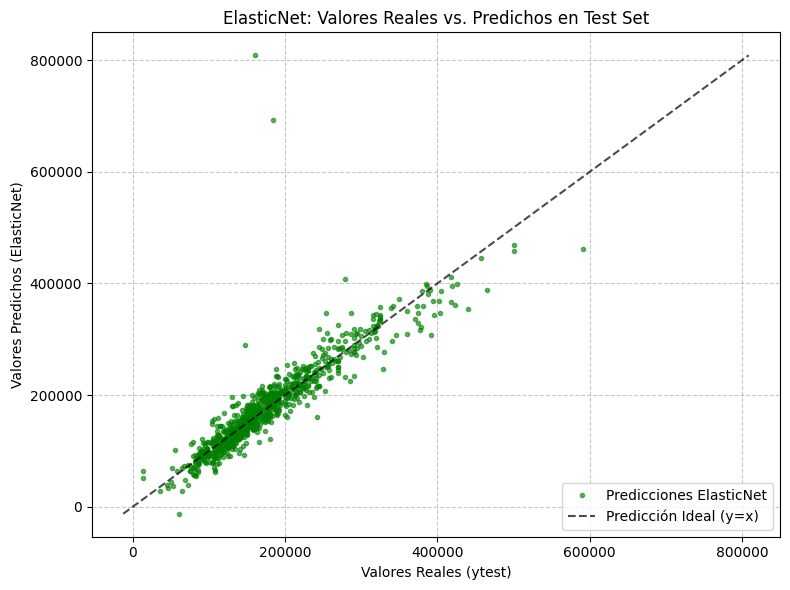


--- Resumen Comparativo de Rendimiento ---
Rendimiento en Validación Cruzada:
  LinearRegression: RMSE = 27882.109 +/- 3219.124, R2 = 0.884 +/- 0.020 [CV completo]
  Lasso: RMSE = nan, R2 = 0.883 (Parámetros: {'lasso__alpha': 1e-05}) [CV completo]
  ElasticNet: RMSE = nan, R2 = 0.885 (Parámetros: {'elasticnet__l1_ratio': 0.1, 'elasticnet__alpha': 0.01}) [CV completo]

Rendimiento Final en el Conjunto de Test (RMSE y R2):
  LinearRegression: RMSE = 37406.704, R2 = 0.746
  Lasso: RMSE = 37520.521, R2 = 0.744
  ElasticNet: RMSE = 35761.909, R2 = 0.768
Predicciones (Bayessian) guardadas en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/y_preds_for_plot_Bayessian.pkl


In [ ]:
# Colores para cada modelo
colors = {
    "LinearRegression": "blue",
    "Lasso": "red",
    "ElasticNet": "green"
}
# Filter only the models that were likely processed in the notebook run
# This assumes that the models present in y_preds_for_plot and final_test_results are the ones
# you want to report on. You might need to adjust this list based on which cells were actually run.
modelos_evaluados = y_preds_for_plot.keys()


print("\n--- Generando Gráficas de Dispersión en Test Set ---")
# Filter y_preds_for_plot to only include models that have corresponding colors defined
# This prevents errors if y_preds_for_plot contains models not in the colors dictionary
y_preds_for_plot_filtered = {name: y_pred for name, y_pred in y_preds_for_plot.items() if name in colors}

for name, y_pred_test in y_preds_for_plot_filtered.items():
    plt.figure(figsize=(8, 6))
    plt.plot(ytest, y_pred_test, '.', alpha=0.6, color=colors.get(name, 'gray'), label=f'Predicciones {name}')
    # Title should reflect which search method was used, but it's hard to know here.
    # Let's keep a generic title or rely on the output text.
    plt.title(f'{name}: Valores Reales vs. Predichos en Test Set')
    plt.xlabel('Valores Reales (ytest)')
    plt.ylabel(f'Valores Predichos ({name})')

    min_val = min(ytest.min(), y_pred_test.min())
    max_val = max(ytest.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.7, label='Predicción Ideal (y=x)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n--- Resumen Comparativo de Rendimiento ---")
print("Rendimiento en Validación Cruzada:")
for name, res in results_cv_grid.items():
    # Check if the model was actually evaluated and has results in results_cv_grid
    if name in modelos_evaluados:
        if 'Best_Params' in res:
            # Results from GridSearchCV or RandomizedSearchCV on a subsample
            if 'RMSE_CV_best_subsample' in res:
                 print(f"  {name}: RMSE = {res.get('RMSE_CV_best_subsample', float('nan')):.3f}, R2 = {res.get('R2_CV_best_subsample', float('nan')):.3f} (Parámetros: {res['Best_Params']}) [CV en submuestra]")
            # Results from GridSearchCV or RandomizedSearchCV on full data
            elif 'RMSE_CV_best' in res:
                 # Handle case where R2 might not be available (e.g., from Bayesian Optimization target)
                 r2_cv_best = res.get('R2_CV_best', float('nan'))
                 print(f"  {name}: RMSE = {res.get('RMSE_CV_best', float('nan')):.3f}, R2 = {r2_cv_best:.3f} (Parámetros: {res['Best_Params']}) [CV completo]")
            # Results from Bayesian Optimization
            elif 'RMSE_CV_best' in res and 'R2_CV_best' not in res:
                 print(f"  {name}: RMSE = {res.get('RMSE_CV_best', float('nan')):.3f} (Parámetros: {res['Best_Params']}) [CV - Bayesian Opt]")

        else:
            # Results from standard cross-validation (no tuning)
            print(f"  {name}: RMSE = {res.get('RMSE_CV_mean', float('nan')):.3f} +/- {res.get('RMSE_CV_std', float('nan')):.3f}, R2 = {res.get('R2_CV_mean', float('nan')):.3f} +/- {res.get('R2_CV_std', float('nan')):.3f} [CV completo]")
    else:
        print(f"  {name}: No se encontraron resultados de CV en results_cv_grid.")


print("\nRendimiento Final en el Conjunto de Test (RMSE y R2):")
for name, res in final_test_results.items():
     # Check if the model was actually evaluated and has results in final_test_results
    if name in modelos_evaluados:
        print(f"  {name}: RMSE = {res.get('RMSE_Test', float('nan')):.3f}, R2 = {res.get('R2_Test', float('nan')):.3f}")
    else:
        print(f"  {name}: No se encontraron resultados en final_test_results.")



# --- Guardar y_preds_for_plot (las predicciones) ---
if y_preds_for_plot:
    # Si 'search_tag' está definida en un ámbito superior (como en las respuestas anteriores),
    # puedes usarla aquí. Si no, defínela aquí si solo guardas este archivo con una etiqueta fija.
    # Por ejemplo, si este es el resultado de una corrida general o de tu mejor búsqueda:
    search_tag = "Bayessian" # O "GridSearch", "RandomizedSearch", etc., según tu preferencia.

    # Guardar las predicciones. Como es un diccionario de arrays, pickle es el mejor.
    # Añade la etiqueta al nombre del archivo
    y_preds_pickle_path = os.path.join(DRIVE_OUTPUT_PATH, f'y_preds_for_plot_{search_tag}.pkl')
    with open(y_preds_pickle_path, 'wb') as f:
        pickle.dump(y_preds_for_plot, f)
    print(f"Predicciones ({search_tag}) guardadas en: {y_preds_pickle_path}")
else:
    print("No hay predicciones para guardar.")

# SEGUNDO BLOQUE

# • KernelRidge

# • SGDRegressor

# • BayesianRidge

No se usa grid search ya que es muy costoso computacionalmente para estos modelos, ademas de que se tienen mejores resultados con randomsearch.

## Justificación de Hiperparámetros y Rangos de Búsqueda por Algoritmo (bloque 2)

### 4. Kernel Ridge

#### Hiperparámetros a buscar:
- **alpha**: Parámetro de regularización (fuerza de la penalización L2 en el espacio del kernel).
- **kernel**: Tipo de función kernel:
  - `linear`
  - `poly`
  - `rbf`
  - `sigmoid`
- **gamma** (para `kernel='rbf'`, `poly`, `sigmoid`): Coeficiente del kernel. Un gamma más alto significa un impacto más localizado de los puntos de entrenamiento.
- **degree** (para `kernel='poly'`): Grado del polinomio.
- **coef0** (para `kernel='poly'`, `sigmoid`): Término independiente en el kernel.

### Justificación:
- KernelRidge es una regresión Ridge que opera en un espacio de características transformado por un kernel. alpha controla la regularización, mientras que kernel y sus parámetros (gamma, degree, coef0) definen la complejidad de las relaciones no lineales que el modelo puede aprender.

### Rejilla/Cotas de valores:

- **`kernelridge__alpha`**  
  - Cotas: `[0.01, 0.1, 1, 10, 100]` (escala logarítmica).

- **`kernelridge__kernel`**  
  - Cotas: `['linear', 'poly', 'rbf']` (Se pueden incluir `'sigmoid'`, pero `'rbf'` y `'poly'` son más comunes).

- **`kernelridge__gamma`**  
  - Cotas (si `kernel='rbf'` o `kernel='poly'`): `[0.001, 0.01, 0.1, 1, 10]` (escala logarítmica).  
  - También se pueden usar `'scale'` o `'auto'`.

- **`kernelridge__degree`**  
  - Cotas (si `kernel='poly'`): `[2, 3, 4]`.

  ### Score a minimizar:
  - RMSE (o MSE, MAE)

### 5. SGDRegressor (Stochastic Gradient Descent Regressor)

#### Hiperparámetros a buscar:
- **`loss`**: Función de pérdida a minimizar:
  - `'squared_error'`
  - `'huber'`
  - `'epsilon_insensitive'`
  - `'squared_epsilon_insensitive'`
- **`penalty`**: Tipo de regularización:
  - `'l1'`
  - `'l2'`
  - `'elasticnet'`
  - `None`
- **`alpha`**: Constante que multiplica el término de regularización.
- **`l1_ratio`** (si `penalty='elasticnet'`): Mezcla entre penalización **L1** y **L2**.
- **`learning_rate`**: Estrategia de tasa de aprendizaje:
  - `'constant'`
  - `'optimal'`
  - `'invscaling'`
  - `'adaptive'`
- **`eta0`** (si `learning_rate='constant'` o `learning_rate='invscaling'`): Tasa de aprendizaje inicial.
- **`max_iter`**: Número máximo de iteraciones sobre los datos de entrenamiento.

#### Justificación:
SGDRegressor es un modelo lineal que se entrena utilizando **descenso de gradiente estocástico**. Su flexibilidad viene de la elección de la **función de pérdida**, el **tipo y fuerza de la regularización**, así como la **estrategia de tasa de aprendizaje**.

#### Rejilla/Cotas de valores:
- **`sgdregressor__loss`**: `['squared_error', 'huber']` (`'huber'` es más robusto a outliers).
- **`sgdregressor__penalty`**: `['l1', 'l2', 'elasticnet']`.
- **`sgdregressor__alpha`**:
  - `loguniform(1e-5, 1e-1)` (para `RandomizedSearchCV`).
  - `[0.0001, 0.001, 0.01]` (para `GridSearchCV`).
- **`sgdregressor__l1_ratio`**:
  - `uniform(0.1, 0.9)` (para `RandomizedSearchCV`).
  - `[0.15, 0.5, 0.85]` (para `GridSearchCV`).
- **`sgdregressor__learning_rate`**: `['invscaling', 'adaptive']`.
- **`sgdregressor__eta0`**: `[0.001, 0.01, 0.1]` (si `learning_rate` no es `'optimal'`).
- **`sgdregressor__max_iter`**: `[1000, 2000, 5000]`.

#### Score a minimizar:
- **RMSE** (Raíz del Error Cuadrático Medio).
- **MSE** (Error Cuadrático Medio).
- **MAE** (Error Absoluto Medio).

### 6. BayesianRidge

#### Hiperparámetros a buscar:
- **`alpha_1`, `alpha_2`**: Hiperparámetros para la distribución **Gamma inversa** sobre la precisión `alpha` del peso de los coeficientes.  
  - Controlan la **forma y escala** de la distribución a priori.
- **`lambda_1`, `lambda_2`**: Hiperparámetros para la distribución **Gamma inversa** sobre la precisión `lambda` del error.  
  - Controlan la **forma y escala** de la distribución a priori.

#### Justificación:
BayesianRidge estima un modelo **Ridge** de forma bayesiana.  
No tiene un `alpha` fijo de regularización, sino que **estima distribuciones sobre `alpha` y `lambda`**, que definen la precisión de los coeficientes y del error.  
Los hiperparámetros `alpha_1`, `alpha_2`, `lambda_1`, `lambda_2` establecen las **distribuciones a priori**.

#### Rejilla/Cotas de valores:
- **`bayesianridge__alpha_1`**: `[1e-6, 1e-5, 1e-4]`
- **`bayesianridge__alpha_2`**: `[1e-6, 1e-5, 1e-4]`
- **`bayesianridge__lambda_1`**: `[1e-6, 1e-5, 1e-4]`
- **`bayesianridge__lambda_2`**: `[1e-6, 1e-5, 1e-4]`

#### Justificación:
Estos valores suelen ser **muy pequeños**, ya que representan la **forma y escala de distribuciones de precisión**.  
Se buscan valores pequeños para establecer **prioris poco informativas**.

#### Score a minimizar:
- **RMSE** (Raíz del Error Cuadrático Medio)
- **MSE** (Error Cuadrático Medio)
- **MAE** (Error Absoluto Medio)



##**RANDOMSEARCH**

### PIPE LINE


In [ ]:
# --- Escalador para la variable objetivo 'y' ---
scaler_y = StandardScaler()
ytrain_scaled = scaler_y.fit_transform(ytrain.values.reshape(-1, 1)).ravel()
ytest_scaled = scaler_y.transform(ytest.values.reshape(-1, 1)).ravel()

# --- Pipelines para KernelRidge, SGDRegressor, BayesianRidge (para RandomizedSearchCV) ---
pipeline_krr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    ('krr', KernelRidge()) # KernelRidge no tiene random_state
])

pipeline_sgd = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    ('sgd', SGDRegressor(random_state=42, max_iter=10000, early_stopping=True, n_iter_no_change=100))
])

pipeline_bayesian = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    ('bayesian', BayesianRidge())
])

# --- Esquemas de validación cruzada ---
cv_light = KFold(n_splits=3, shuffle=True, random_state=42) # Para modelos ligeros

# --- Función para calcular MAPE ---
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    non_zero_mask = y_true != 0
    if not np.all(non_zero_mask):
        warnings.warn("Se encontraron valores de y_true cero en el cálculo de MAPE. Se excluirán para evitar división por cero. Esto puede afectar la interpretabilidad si los ceros son valores válidos esperados.")
        y_true = y_true[non_zero_mask]
        y_pred = y_pred[non_zero_mask]
        if len(y_true) == 0:
            return np.nan

    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Función para calcular RMSE explícitamente
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Definir métricas de scoring para RandomizedSearchCV
scoring_metrics = {
    'rmse': make_scorer(root_mean_squared_error, greater_is_better=False), # Usamos la función auxiliar para RMSE
    'r2': 'r2',
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'mape': make_scorer(mean_absolute_percentage_error, greater_is_better=False)
}

# --- Diccionario de modelos y sus parámetros para RandomizedSearchCV ---
models_and_params_light = {
    "KernelRidge": {
        "pipeline": pipeline_krr,
        "param_distributions": {
            'krr__alpha': [0.05, 0.1, 0.2],
            'krr__kernel': ['polynomial', 'rbf'],
            'krr__gamma': [0.005, 0.01, 0.05, 0.1, 0.5, 1.0],
            'krr__degree': [2, 3]
        },
        "cv_folds": cv_light,
        "data_fraction": 0.3,
        "search_type": "RandomizedSearchCV",
        "n_iter": 30
    },
    "SGDRegressor": {
        "pipeline": pipeline_sgd,
        "param_distributions": {
            'sgd__loss': ['huber'],
            'sgd__penalty': ['l2'],
            'sgd__alpha': loguniform(1e-7, 1e-3),
            'sgd__learning_rate': ['invscaling', 'adaptive'],
            'sgd__eta0': loguniform(1e-4, 0.1),
            'sgd__power_t': uniform(0.1, 0.4)
        },
        "cv_folds": cv_light,
        "data_fraction": 0.1,
        "search_type": "RandomizedSearchCV",
        "n_iter": 100
    },
    "BayesianRidge": {
        "pipeline": pipeline_bayesian,
        "param_distributions": {
            'bayesian__alpha_1': loguniform(1e-7, 1e-3),
            'bayesian__alpha_2': loguniform(1e-7, 1e-3),
            'bayesian__lambda_1': loguniform(1e-7, 1e-3),
            'bayesian__lambda_2': loguniform(1e-7, 1e-3)
        },
        "cv_folds": cv_light,
        "data_fraction": 0.3,
        "search_type": "RandomizedSearchCV",
        "n_iter": 40
    }
}

best_estimators = {}
results_cv_grid = {}
final_test_results = {}
y_preds_for_plot = {}

print("--- Optimizando y Evaluando Modelos con RandomizedSearchCV ---")

# --- Procesar Modelos Ligeros (KernelRidge, SGDRegressor, BayesianRidge) ---
print("\n--- Procesando Modelos Ligeros (KernelRidge, SGDRegressor, BayesianRidge) con RandomizedSearchCV ---")

for name, config in models_and_params_light.items():
    print(f"\nProcesando {name}...")
    model_pipeline = config["pipeline"]
    param_distributions = config["param_distributions"]
    current_cv = config["cv_folds"]
    data_fraction = config["data_fraction"]
    n_iter = config["n_iter"]

    # Create a subsample for tuning this specific model
    Xtrain_subsample, _, ytrain_subsample_scaled, _ = train_test_split(
        Xtrain, ytrain_scaled, test_size=(1 - data_fraction), random_state=42
    )
    print(f"   Usando submuestra de entrenamiento para {name}: {Xtrain_subsample.shape[0]} muestras ({data_fraction*100:.0f}%)")


    random_search = RandomizedSearchCV(
        estimator=model_pipeline,
        param_distributions=param_distributions,
        n_iter=n_iter,
        cv=current_cv,
        scoring=scoring_metrics,
        refit='rmse',
        n_jobs=-1,
        verbose=1,
        random_state=42,
        return_train_score=True,
        error_score='raise'
    )

    print(f"   Buscando los mejores hiperparámetros para {name} en una submuestra...")
    random_search.fit(Xtrain_subsample, ytrain_subsample_scaled)


    best_estimator_cv = random_search.best_estimator_
    best_params = random_search.best_params_

    # Get best RMSE (scaled) and R2 from CV results
    # For make_scorer(root_mean_squared_error, greater_is_better=False), the score is already negative RMSE
    best_score_rmse_cv_scaled = -random_search.cv_results_['mean_test_rmse'][random_search.best_index_]
    best_score_r2_cv = random_search.cv_results_['mean_test_r2'][random_search.best_index_]
    best_score_mae_cv_scaled = -random_search.cv_results_['mean_test_mae'][random_search.best_index_]
    best_score_mape_cv = -random_search.cv_results_['mean_test_mape'][random_search.best_index_]

    # Convert RMSE and MAE back to original scale for reporting
    scale_factor = scaler_y.scale_[0] if scaler_y.scale_.ndim > 0 else scaler_y.scale_
    best_score_rmse_cv = best_score_rmse_cv_scaled * scale_factor
    best_score_mae_cv = best_score_mae_cv_scaled * scale_factor


    print(f"   Mejores parámetros para {name}: {best_params}")
    print(f"   RMSE (CV - Mejor en submuestra, escala original): {best_score_rmse_cv:.3f}")
    print(f"   R2 (CV - Mejor en submuestra):   {best_score_r2_cv:.3f}")
    print(f"   MAE (CV - Mejor en submuestra, escala original): {best_score_mae_cv:.3f}")
    print(f"   MAPE (CV - Mejor en submuestra): {best_score_mape_cv:.3f}%")


    print(f"   Reentrenando {name} con los parámetros óptimos en todo el conjunto de entrenamiento (y escalado)...")
    final_model_for_test = model_pipeline.set_params(**best_params)
    final_model_for_test.fit(Xtrain, ytrain_scaled)

    best_estimators[name] = final_model_for_test
    results_cv_grid[name] = {
        'Best_Params': best_params,
        'RMSE_CV_best_subsample': best_score_rmse_cv,
        'R2_CV_best_subsample': best_score_r2_cv,
        'MAE_CV_best_subsample': best_score_mae_cv,
        'MAPE_CV_best_subsample': best_score_mape_cv
    }

    print(f"   Evaluando {name} en el Test Set (modelo entrenado en Xtrain completo, y escalado)...")
    y_pred_test_scaled = final_model_for_test.predict(Xtest)
    y_pred_test = scaler_y.inverse_transform(y_pred_test_scaled.reshape(-1, 1)).ravel()

    y_preds_for_plot[name] = y_pred_test

    # Calculate all required metrics on the original scale
    mse_test = mean_squared_error(ytest, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(ytest, y_pred_test)
    mae_test = mean_absolute_error(ytest, y_pred_test)
    mape_test = mean_absolute_percentage_error(ytest, y_pred_test)

    final_test_results[name] = {
        'RMSE_Test': rmse_test,
        'R2_Test': r2_test,
        'MAE_Test': mae_test,
        'MAPE_Test': mape_test,
        'MSE_Test': mse_test
    }
    print(f"   RMSE (Test Set): {final_test_results[name]['RMSE_Test']:.3f}")
    print(f"   R2 (Test Set):   {final_test_results[name]['R2_Test']:.3f}")
    print(f"   MAE (Test Set):  {final_test_results[name]['MAE_Test']:.3f}")
    print(f"   MAPE (Test Set): {final_test_results[name]['MAPE_Test']:.3f}%")

print("\n--- RandomizedSearchCV para Modelos Ligeros Completado ---")

--- Optimizando y Evaluando Modelos con RandomizedSearchCV ---

--- Procesando Modelos Ligeros (KernelRidge, SGDRegressor, BayesianRidge) con RandomizedSearchCV ---

Procesando KernelRidge...
   Usando submuestra de entrenamiento para KernelRidge: 615 muestras (30%)
   Buscando los mejores hiperparámetros para KernelRidge en una submuestra...
Fitting 3 folds for each of 30 candidates, totalling 90 fits
   Mejores parámetros para KernelRidge: {'krr__kernel': 'polynomial', 'krr__gamma': 0.01, 'krr__degree': 2, 'krr__alpha': 0.2}
   RMSE (CV - Mejor en submuestra, escala original): 23054.320
   R2 (CV - Mejor en submuestra):   0.924
   MAE (CV - Mejor en submuestra, escala original): 16022.925
   MAPE (CV - Mejor en submuestra): 73.823%
   Reentrenando KernelRidge con los parámetros óptimos en todo el conjunto de entrenamiento (y escalado)...
   Evaluando KernelRidge en el Test Set (modelo entrenado en Xtrain completo, y escalado)...
   RMSE (Test Set): 56816.109
   R2 (Test Set):   0.414

### GUARDADO

In [ ]:
# Define la misma ruta base en Drive donde guardas Xtest y ytest
# Asegúrate de que esta ruta sea accesible desde Colab
DRIVE_OUTPUT_PATH = '/content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA' # <-- Nueva carpeta para resultados

# Crea la carpeta si no existe
os.makedirs(DRIVE_OUTPUT_PATH, exist_ok=True)
print(f"Directorio de resultados creado: {DRIVE_OUTPUT_PATH}")

# Define la etiqueta que quieres añadir a los nombres de los archivos
# Puedes cambiar esto a 'RandomizedSearch' o cualquier otra cosa si el contexto es diferente
search_tag = "RandomizedSearch"

# --- Guardar resultados de final_test_results ---
if final_test_results:
    final_results_df = pd.DataFrame.from_dict(final_test_results, orient='index')
    # Añade la etiqueta al nombre del archivo
    final_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'final_test_results_{search_tag}.csv')
    final_results_df.to_csv(final_results_csv_path, index=True)
    print(f"Resultados de test ({search_tag}) guardados en: {final_results_csv_path}")
else:
    print("No hay resultados de test para guardar.")


# --- Guardar resultados de results_cv_grid ---
if results_cv_grid:
    cv_results_list = []
    for model_name, metrics in results_cv_grid.items():
        row = {'Model': model_name}
        for key, value in metrics.items():
            if isinstance(value, dict): # Para Best_Params
                for param_key, param_value in value.items():
                    row[f'Param_{param_key}'] = param_value
            else:
                row[key] = value
        cv_results_list.append(row)

    if cv_results_list:
        cv_results_df = pd.DataFrame(cv_results_list)
        # Añade la etiqueta al nombre del archivo
        cv_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'cv_grid_results_{search_tag}.csv')
        cv_results_df.to_csv(cv_results_csv_path, index=False)
        print(f"Resultados de CV ({search_tag}) guardados en: {cv_results_csv_path}")
    else:
        print("No hay resultados de CV para guardar.")
else:
    print("No hay resultados de CV para guardar.")

Directorio de resultados creado: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA
Resultados de test (RandomizedSearch) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/final_test_results_RandomizedSearch.csv
Resultados de CV (RandomizedSearch) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/cv_grid_results_RandomizedSearch.csv


###VISUALIZACIÓN RANDOMSEARCH


--- Generando Gráficas de Dispersión en Test Set ---


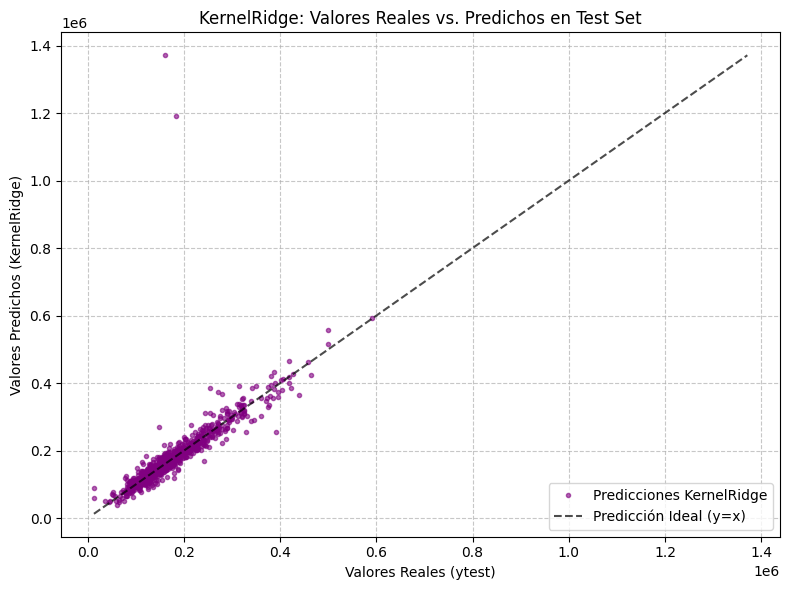

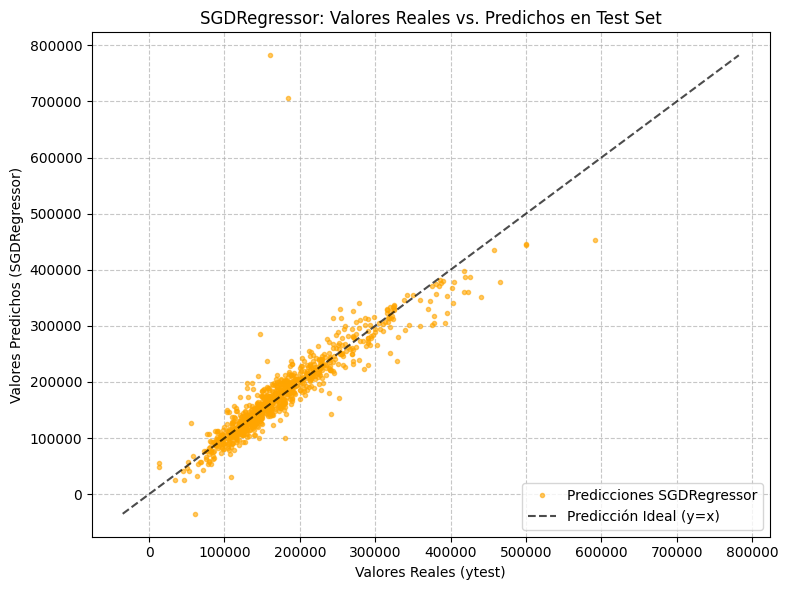

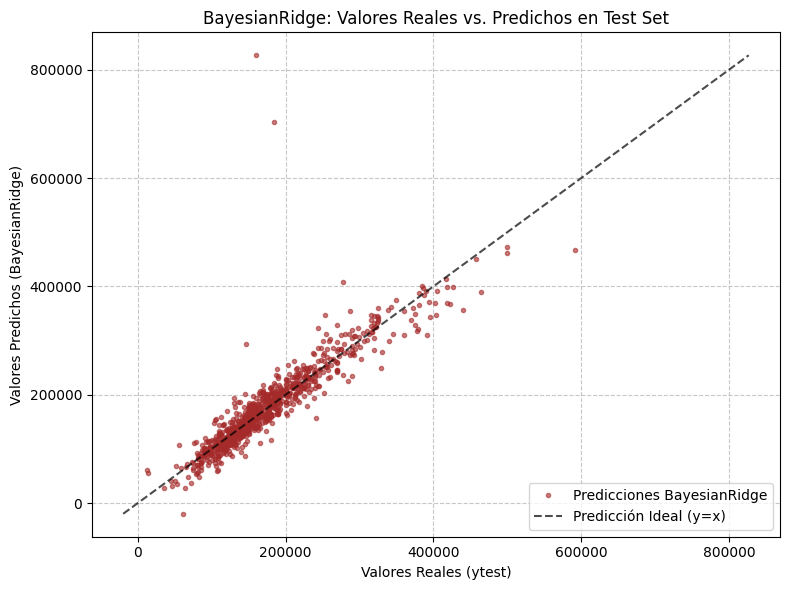


--- Resumen Comparativo de Rendimiento ---
Rendimiento en Validación Cruzada (RMSE, R2, MAE, MAPE en submuestra):
   KernelRidge:
     RMSE = 23054.320
     R2   = 0.924
     MAE  = 16022.925
     MAPE = 73.823% (Parámetros: {'krr__kernel': 'polynomial', 'krr__gamma': 0.01, 'krr__degree': 2, 'krr__alpha': 0.2}) [CV en submuestra]
   SGDRegressor:
     RMSE = 40078.308
     R2   = 0.821
     MAE  = 24846.885
     MAPE = 93.927% (Parámetros: {'sgd__alpha': np.float64(9.27703432741471e-07), 'sgd__eta0': np.float64(0.00019024283247489598), 'sgd__learning_rate': 'adaptive', 'sgd__loss': 'huber', 'sgd__penalty': 'l2', 'sgd__power_t': np.float64(0.32331738144283906)}) [CV en submuestra]
   BayesianRidge:
     RMSE = 31663.215
     R2   = 0.856
     MAE  = 21392.044
     MAPE = 103.087% (Parámetros: {'bayesian__alpha_1': np.float64(1.9870215385428617e-07), 'bayesian__alpha_2': np.float64(0.0008862326508576246), 'bayesian__lambda_1': np.float64(0.00012273800987852966), 'bayesian__lambda_2': np

In [ ]:
# --- Código para el ploteo y resumen ---
colors = {
    "KernelRidge": "purple",
    "SGDRegressor": "orange",
    "BayesianRidge": "brown"
}

modelos_evaluados = y_preds_for_plot.keys()

print("\n--- Generando Gráficas de Dispersión en Test Set ---")
y_preds_for_plot_filtered = {name: y_pred for name, y_pred in y_preds_for_plot.items() if name in colors}

for name, y_pred_test in y_preds_for_plot_filtered.items():
    plt.figure(figsize=(8, 6))
    plt.plot(ytest, y_pred_test, '.', alpha=0.6, color=colors.get(name, 'gray'), label=f'Predicciones {name}')
    plt.title(f'{name}: Valores Reales vs. Predichos en Test Set')
    plt.xlabel('Valores Reales (ytest)')
    plt.ylabel(f'Valores Predichos ({name})')

    min_val = min(ytest.min(), y_pred_test.min())
    max_val = max(ytest.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.7, label='Predicción Ideal (y=x)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n--- Resumen Comparativo de Rendimiento ---")
print("Rendimiento en Validación Cruzada (RMSE, R2, MAE, MAPE en submuestra):")
for name, res in results_cv_grid.items():
    if name in modelos_evaluados:
        rmse_cv_best = res.get('RMSE_CV_best_subsample', float('nan'))
        r2_cv_best = res.get('R2_CV_best_subsample', float('nan'))
        mae_cv_best = res.get('MAE_CV_best_subsample', float('nan'))
        mape_cv_best = res.get('MAPE_CV_best_subsample', float('nan'))
        print(f"   {name}:")
        print(f"     RMSE = {rmse_cv_best:.3f}")
        print(f"     R2   = {r2_cv_best:.3f}")
        print(f"     MAE  = {mae_cv_best:.3f}")
        print(f"     MAPE = {mape_cv_best:.3f}% (Parámetros: {res['Best_Params']}) [CV en submuestra]")
    else:
        print(f"   {name}: No se encontraron resultados de CV en results_cv_grid.")


print("\nRendimiento Final en el Conjunto de Test (RMSE, R2, MAE, MSE, MAPE):")
for name, res in final_test_results.items():
    if name in modelos_evaluados:
        print(f"   {name}:")
        print(f"     RMSE = {res.get('RMSE_Test', float('nan')):.3f}")
        print(f"     R2   = {res.get('R2_Test', float('nan')):.3f}")
        print(f"     MAE  = {res.get('MAE_Test', float('nan')):.3f}")
        print(f"     MSE  = {res.get('MSE_Test', float('nan')):.3f}")
        print(f"     MAPE = {res.get('MAPE_Test', float('nan')):.3f}%")
    else:
        print(f"   {name}: No se encontraron resultados en final_test_results.")


# --- Guardar y_preds_for_plot (las predicciones) ---
if y_preds_for_plot:
    # Si 'search_tag' está definida en un ámbito superior (como en las respuestas anteriores),
    # puedes usarla aquí. Si no, defínela aquí si solo guardas este archivo con una etiqueta fija.
    # Por ejemplo, si este es el resultado de una corrida general o de tu mejor búsqueda:
    search_tag = "RandomizedSearch" # O "GridSearch", "RandomizedSearch", etc., según tu preferencia.

    # Guardar las predicciones. Como es un diccionario de arrays, pickle es el mejor.
    # Añade la etiqueta al nombre del archivo
    y_preds_pickle_path = os.path.join(DRIVE_OUTPUT_PATH, f'y_preds_for_plot_{search_tag}.pkl')
    with open(y_preds_pickle_path, 'wb') as f:
        pickle.dump(y_preds_for_plot, f)
    print(f"Predicciones ({search_tag}) guardadas en: {y_preds_pickle_path}")
else:
    print("No hay predicciones para guardar.")

## **OPTIMIZACION BAYESIANA**



### PIPE LINE

In [ ]:
# Función para calcular MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    import warnings
    # Avoid division by zero: if y_true is 0, and y_pred is also 0, error is 0.
    # If y_true is 0 and y_pred is not, it's an infinite error, so we handle it.
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_indices = y_true != 0

    if np.any(~non_zero_indices): # If there are zeros in y_true
        # Handle cases where true value is zero. A common approach is to ignore them or assign a very large error.
        # For this problem, house prices should not be zero, so we'll proceed assuming non-zero y_true.
        # If zeros are possible, you might want a more sophisticated handling (e.g., replace 0 with a small epsilon or filter them out).
        warnings.warn("Zero values found in y_true, MAPE might be undefined or infinite. Excluding them from calculation.")
        y_true = y_true[non_zero_indices]
        y_pred = y_pred[non_zero_indices]
        if len(y_true) == 0: return np.nan # No non-zero true values left

    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Custom scorer for MAPE
mape_scorer = make_scorer(mean_absolute_percentage_error, greater_is_better=False) # Lower MAPE is better

# --- Esquemas de validación cruzada ---
cv_folds_bayesian = KFold(n_splits=3, shuffle=True, random_state=42) # Smaller folds for faster CV during BayesOpt

# --- Métricas de scoring para la función objetivo de BayesianOptimization ---
# BayesianOptimization maximiza la métrica, así que para RMSE y MAE usamos el negativo.
scoring_metrics_bayesian = {
    'rmse': make_scorer(mean_squared_error, greater_is_better=False),
    'r2': 'r2',
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'mape': mape_scorer # Using custom MAPE scorer
}

results_bayesian_optimization = {}
best_estimators = {}
final_test_results = {}
y_preds_for_plot = {}


print("--- Optimizando y Evaluando Modelos con Optimización Bayesiana ---")

# --- Diccionario de modelos y sus rangos de hiperparámetros para BayesianOptimization ---
# Los rangos deben ser números flotantes. Las variables categóricas o discretas
# a veces se representan como rangos flotantes y se convierten dentro de la función objetivo.
models_for_bayesian = {
    "KernelRidge": {
        "pipeline": Pipeline(steps=[
            ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
            ('scaler', StandardScaler()),
            ('krr', KernelRidge())
        ]),
        "param_bounds": {
            'krr__alpha': (1e-3, 1.0), # alpha can be from small to large
            'krr__kernel': (0, 1),    # 0 for 'polynomial', 1 for 'rbf' (or any threshold)
            'krr__gamma': (1e-5, 10.0), # Gamma can be very small or quite large
            'krr__degree': (1, 4),    # Integer degree
            'krr__coef0': (0.0, 1.0) # For polynomial kernel
        },
        "cv_folds": cv_folds_bayesian,
        "data_fraction": 0.3,
        "init_points": 5, # Number of random points to start search
        "n_iter": 20 # Number of iterations for Bayesian Optimization
    },
    "SGDRegressor": {
        "pipeline": Pipeline(steps=[
            ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
            ('scaler', StandardScaler()),
            ('sgd', SGDRegressor(random_state=42, max_iter=10000, early_stopping=True, n_iter_no_change=100))
        ]),
        "param_bounds": {
            # 'sgd__loss': (0, 1), # 'squared_error' vs 'huber'. We are sticking to huber as per original
            # 'sgd__penalty': (0, 1), # 'l1' vs 'l2' vs 'elasticnet'. Sticking to l2 as per original
            'sgd__alpha': (1e-7, 1e-3),
            'sgd__learning_rate': (0, 1), # 0 for 'invscaling', 1 for 'adaptive'
            'sgd__eta0': (1e-4, 0.1),
            'sgd__power_t': (0.1, 0.5) # Range for uniform distribution
        },
        "cv_folds": cv_folds_bayesian,
        "data_fraction": 0.1,
        "init_points": 10,
        "n_iter": 50 # More iterations for SGD due to more parameters
    },
    "BayesianRidge": {
        "pipeline": Pipeline(steps=[
            ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
            ('scaler', StandardScaler()),
            ('bayesian', BayesianRidge())
        ]),
        "param_bounds": {
            'bayesian__alpha_1': (1e-7, 1e-3),
            'bayesian__alpha_2': (1e-7, 1e-3),
            'bayesian__lambda_1': (1e-7, 1e-3),
            'bayesian__lambda_2': (1e-7, 1e-3)
        },
        "cv_folds": cv_folds_bayesian,
        "data_fraction": 0.3,
        "init_points": 5,
        "n_iter": 30
    }
}

print("\n--- Procesando Modelos con Optimización Bayesiana ---")

for name, config in models_for_bayesian.items():
    print(f"\nProcesando {name} con Optimización Bayesiana...")
    param_bounds = config["param_bounds"]
    current_cv = config["cv_folds"]
    data_fraction = config["data_fraction"]
    init_points = config["init_points"]
    n_iter = config["n_iter"]

    # Create a subsample for tuning this specific model
    # ¡IMPORTANTE! Usar ytrain_scaled aquí
    Xtrain_subsample_full, _, ytrain_subsample_scaled_full, _ = train_test_split(
        Xtrain, ytrain_scaled, test_size=(1 - data_fraction), random_state=42
    )
    print(f"   Usando submuestra de entrenamiento para {name}: {Xtrain_subsample_full.shape[0]} muestras ({data_fraction*100:.0f}%)")

    # --- Function to evaluate the model with given parameters ---
    # This function now takes the fixed data and scaler as arguments,
    # in addition to the hyperparameters.
    def evaluate_model_with_data(model_name, X_subsample, y_subsample_scaled, cv, scaler, **params):
        pipeline = models_for_bayesian[model_name]["pipeline"]
        current_cv = cv # Use the passed cv object

        # Set parameters for the model within the pipeline
        model_step_name = None
        if model_name == "KernelRidge": model_step_name = 'krr'
        elif model_name == "SGDRegressor": model_step_name = 'sgd'
        elif model_name == "BayesianRidge": model_step_name = 'bayesian'

        # Handle parameters that might be strings or need casting
        processed_params = {}
        for k, v in params.items():
            if model_step_name:
                # For KernelRidge 'gamma' can be 'scale'
                if k == f'{model_step_name}__gamma' and v < 0: # Representing 'scale' by a negative value
                    processed_params[k] = 'scale'
                elif k == f'{model_step_name}__kernel':
                    processed_params[k] = 'polynomial' if v < 0.5 else 'rbf'
                elif k == f'{model_step_name}__degree':
                    processed_params[k] = int(round(v)) # Convert to integer
                elif k == f'{model_step_name}__learning_rate':
                    processed_params[k] = 'invscaling' if v < 0.5 else 'adaptive'
                else: # For penalties like 'elasticnet' in SGD
                     processed_params[k] = v
            else:
                processed_params[k] = v # Fallback

        # Correctly apply parameters to the pipeline steps
        param_dict = {}
        for p_name, p_value in processed_params.items():
            # Find the correct step name (e.g., 'krr', 'sgd', 'bayesian') and parameter name
            step_name, param_name = p_name.split('__')
            param_dict[f'{step_name}__{param_name}'] = p_value

        pipeline.set_params(**param_dict)


        # Perform cross-validation on the subsample
        cv_results = []
        for train_idx, val_idx in current_cv.split(X_subsample):
            X_train_fold, X_val_fold = X_subsample.iloc[train_idx], X_subsample.iloc[val_idx]
            y_train_fold_scaled, y_val_fold_scaled = y_subsample_scaled[train_idx], y_subsample_scaled[val_idx]

            pipeline.fit(X_train_fold, y_train_fold_scaled)
            y_pred_scaled = pipeline.predict(X_val_fold)

            # Desescalar predicciones y values reales para calcular métricas en escala original
            y_pred_original = scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
            y_val_original = scaler.inverse_transform(y_val_fold_scaled.reshape(-1, 1)).ravel()

            rmse = np.sqrt(mean_squared_error(y_val_original, y_pred_original))
            # r2 = r2_score(y_val_original, y_pred_original) # Calculate if needed
            # mae = mean_absolute_error(y_val_original, y_pred_original) # Calculate if needed
            # mape = mean_absolute_percentage_error(y_val_original, y_pred_original) # Calculate if needed

            cv_results.append({'rmse': rmse}) # Only store RMSE for maximization target

        avg_rmse = np.mean([res['rmse'] for res in cv_results])

        # BayesianOptimization maximiza, así que devolvemos el negativo del RMSE para minimizarlo
        return -avg_rmse


    # Use functools.partial to create the objective function for BayesianOptimization
    # This function will take only the hyperparameters as arguments,
    # but will have access to the fixed data (Xtrain_subsample_full, ytrain_subsample_scaled_full, etc.)
    # from the outer scope.
    optimizer_objective = partial(
        evaluate_model_with_data,
        model_name=name, # Pass the model name
        X_subsample=Xtrain_subsample_full,
        y_subsample_scaled=ytrain_subsample_scaled_full,
        cv=current_cv,
        scaler=scaler_y
    )

    # BayesianOptimization needs a callable function
    optimizer = BayesianOptimization(
        f=optimizer_objective, # Pass the partial function
        pbounds=param_bounds,
        random_state=42,
        verbose=0 # Set to 1 for more verbose output during optimization
    )

    optimizer.maximize(
        init_points=init_points,
        n_iter=n_iter
    )

    best_params_bayesian = optimizer.max['params']
    best_neg_rmse_scaled_bayesian = optimizer.max['target']

    # Convert back categorical/discrete parameters if they were encoded as floats
    processed_best_params = {}
    model_step_name = None
    if name == "KernelRidge": model_step_name = 'krr'
    elif name == "SGDRegressor": model_step_name = 'sgd'
    elif name == "BayesianRidge": model_step_name = 'bayesian'

    for k, v in best_params_bayesian.items():
        if model_step_name:
            # Note: When reading from best_params_bayesian, 'krr__gamma' will be the float value.
            # We only map negative floats to 'scale' during the call to set_params inside evaluate_model_with_data.
            # When reporting best parameters, we report the actual float value found by optimization for gamma.
            if k == f'{model_step_name}__kernel':
                processed_best_params[k] = 'polynomial' if v < 0.5 else 'rbf'
            elif k == f'{model_step_name}__degree':
                processed_best_params[k] = int(round(v)) # Convert to integer
            elif k == f'{model_step_name}__learning_rate':
                processed_best_params[k] = 'invscaling' if v < 0.5 else 'adaptive'
            else:
                processed_best_params[k] = v
        else:
            processed_best_params[k] = v


    best_neg_rmse_scaled = -best_neg_rmse_scaled_bayesian
    scale_factor = scaler_y.scale_[0] if scaler_y.scale_.ndim > 0 else scaler_y.scale_
    best_rmse_original = best_neg_rmse_scaled * scale_factor

    print(f"   Mejores parámetros encontrados para {name}: {processed_best_params}")
    print(f"   Mejor RMSE (CV en submuestra, escala original): {best_rmse_original:.3f}")

    # Retrain the best model with the optimal hyperparameters on the FULL training set
    print(f"   Reentrenando {name} con los parámetros óptimos en todo el conjunto de entrenamiento (y escalado)...")
    # Use the original pipeline from models_for_bayesian to ensure it has the correct steps
    final_model_pipeline = models_for_bayesian[name]["pipeline"].set_params(**processed_best_params)
    final_model_pipeline.fit(Xtrain, ytrain_scaled)

    best_estimators[name] = final_model_pipeline
    results_bayesian_optimization[name] = {
        'Best_Params': processed_best_params,
        'RMSE_CV_best_subsample': best_rmse_original,
    }

    # Evaluation on the Test Set
    print(f"   Evaluando {name} en el Test Set...")
    y_pred_test_scaled = final_model_pipeline.predict(Xtest)
    y_pred_test = scaler_y.inverse_transform(y_pred_test_scaled.reshape(-1, 1)).ravel()

    y_preds_for_plot[name] = y_pred_test

    # Calculate all required metrics on the original scale
    mse_test = mean_squared_error(ytest, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(ytest, y_pred_test)
    mae_test = mean_absolute_error(ytest, y_pred_test)
    mape_test = mean_absolute_percentage_error(ytest, y_pred_test)

    final_test_results[name] = {
        'RMSE_Test': rmse_test,
        'R2_Test': r2_test,
        'MAE_Test': mae_test,
        'MAPE_Test': mape_test,
        'MSE_Test': mse_test # Add MSE for completeness
    }
    print(f"   RMSE (Test Set): {rmse_test:.3f}")
    print(f"   R2 (Test Set):   {r2_test:.3f}")
    print(f"   MAE (Test Set):  {mae_test:.3f}")
    print(f"   MAPE (Test Set): {mape_test:.3f}%") # Format as percentage

print("\n--- Optimización Bayesiana Completada ---")

--- Optimizando y Evaluando Modelos con Optimización Bayesiana ---

--- Procesando Modelos con Optimización Bayesiana ---

Procesando KernelRidge con Optimización Bayesiana...
   Usando submuestra de entrenamiento para KernelRidge: 615 muestras (30%)
   Mejores parámetros encontrados para KernelRidge: {'krr__alpha': np.float64(0.001), 'krr__coef0': np.float64(1.0), 'krr__degree': 3, 'krr__gamma': np.float64(1.447382290256496), 'krr__kernel': 'polynomial'}
   Mejor RMSE (CV en submuestra, escala original): 2539700876.144
   Reentrenando KernelRidge con los parámetros óptimos en todo el conjunto de entrenamiento (y escalado)...
   Evaluando KernelRidge en el Test Set...
   RMSE (Test Set): 96666.867
   R2 (Test Set):   -0.698
   MAE (Test Set):  21881.259
   MAPE (Test Set): 14.915%

Procesando SGDRegressor con Optimización Bayesiana...
   Usando submuestra de entrenamiento para SGDRegressor: 205 muestras (10%)
   Mejores parámetros encontrados para SGDRegressor: {'sgd__alpha': np.float6

### GUARDADO

In [ ]:
# Define la misma ruta base en Drive donde guardas Xtest y ytest
# Asegúrate de que esta ruta sea accesible desde Colab
DRIVE_OUTPUT_PATH = '/content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA' # <-- Nueva carpeta para resultados

# Crea la carpeta si no existe
os.makedirs(DRIVE_OUTPUT_PATH, exist_ok=True)
print(f"Directorio de resultados creado: {DRIVE_OUTPUT_PATH}")

# Define la etiqueta que quieres añadir a los nombres de los archivos
# Puedes cambiar esto a 'RandomizedSearch' o cualquier otra cosa si el contexto es diferente
search_tag = "Bayessian"

# --- Guardar resultados de final_test_results ---
if final_test_results:
    final_results_df = pd.DataFrame.from_dict(final_test_results, orient='index')
    # Añade la etiqueta al nombre del archivo
    final_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'final_test_results_{search_tag}.csv')
    final_results_df.to_csv(final_results_csv_path, index=True)
    print(f"Resultados de test ({search_tag}) guardados en: {final_results_csv_path}")
else:
    print("No hay resultados de test para guardar.")


# --- Guardar resultados de results_cv_grid ---
if results_cv_grid:
    cv_results_list = []
    for model_name, metrics in results_cv_grid.items():
        row = {'Model': model_name}
        for key, value in metrics.items():
            if isinstance(value, dict): # Para Best_Params
                for param_key, param_value in value.items():
                    row[f'Param_{param_key}'] = param_value
            else:
                row[key] = value
        cv_results_list.append(row)

    if cv_results_list:
        cv_results_df = pd.DataFrame(cv_results_list)
        # Añade la etiqueta al nombre del archivo
        cv_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'cv_grid_results_{search_tag}.csv')
        cv_results_df.to_csv(cv_results_csv_path, index=False)
        print(f"Resultados de CV ({search_tag}) guardados en: {cv_results_csv_path}")
    else:
        print("No hay resultados de CV para guardar.")
else:
    print("No hay resultados de CV para guardar.")

Directorio de resultados creado: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA
Resultados de test (Bayessian) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/final_test_results_Bayessian.csv
Resultados de CV (Bayessian) guardados en: /content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA/cv_grid_results_Bayessian.csv


### VISUALIZACIÓN OPTIMIZACION BAYESIANA


--- Generando Gráficas de Dispersión en Test Set ---


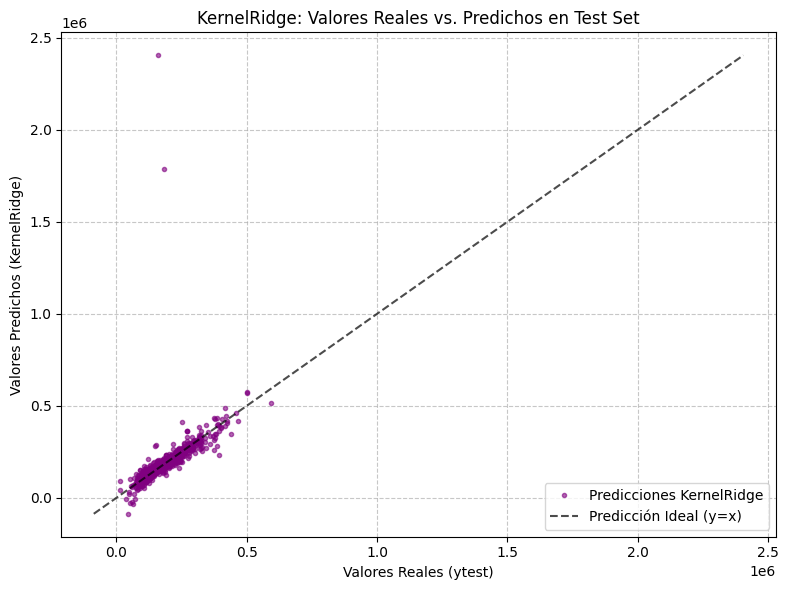

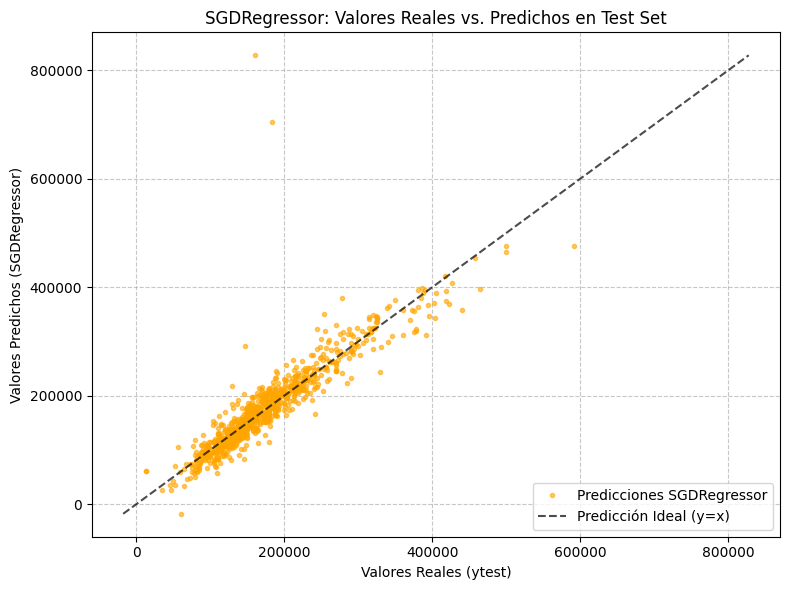

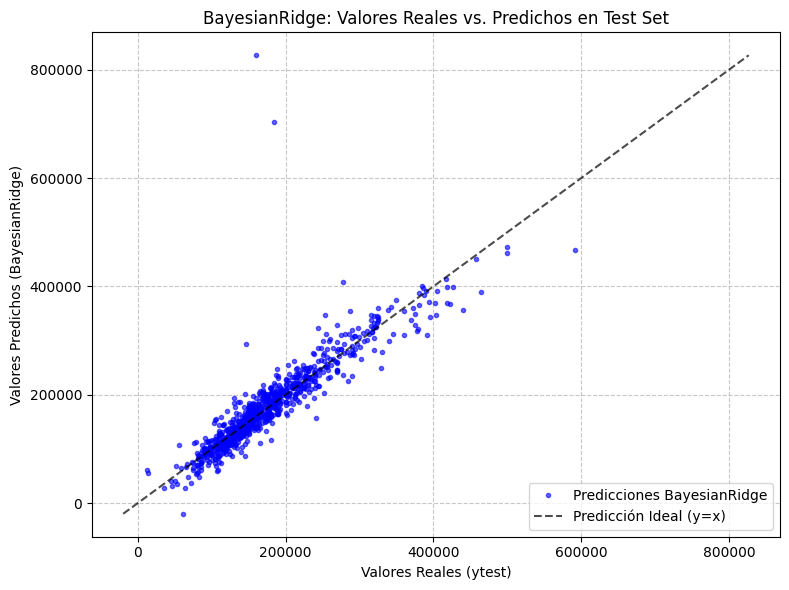


--- Resumen Comparativo de Rendimiento ---
Rendimiento en Validación Cruzada (RMSE, R2, MAE, MAPE en submuestra):
   KernelRidge:
     RMSE = 23054.320
     R2   = 0.924
     MAE  = 16022.925
     MAPE = 73.823% (Parámetros: {'krr__kernel': 'polynomial', 'krr__gamma': 0.01, 'krr__degree': 2, 'krr__alpha': 0.2}) [CV en submuestra]
   SGDRegressor:
     RMSE = 40078.308
     R2   = 0.821
     MAE  = 24846.885
     MAPE = 93.927% (Parámetros: {'sgd__alpha': np.float64(9.27703432741471e-07), 'sgd__eta0': np.float64(0.00019024283247489598), 'sgd__learning_rate': 'adaptive', 'sgd__loss': 'huber', 'sgd__penalty': 'l2', 'sgd__power_t': np.float64(0.32331738144283906)}) [CV en submuestra]
   BayesianRidge:
     RMSE = 31663.215
     R2   = 0.856
     MAE  = 21392.044
     MAPE = 103.087% (Parámetros: {'bayesian__alpha_1': np.float64(1.9870215385428617e-07), 'bayesian__alpha_2': np.float64(0.0008862326508576246), 'bayesian__lambda_1': np.float64(0.00012273800987852966), 'bayesian__lambda_2': np

In [ ]:
# --- Código para el ploteo y resumen (con el ajuste para results_cv_grid) ---
colors = {
    "KernelRidge": "purple",
    "SGDRegressor": "orange",
    "BayesianRidge": "brown",
    "GaussianProcessRegressor": "cyan", # Mantener si se usaron antes
    "RandomForestRegressor": "darkgreen", # Mantener si se usaron antes
    "SVR": "magenta", # Mantener si se usaron antes
    "BayesianRidge": "blue"
}

modelos_evaluados = y_preds_for_plot.keys()

print("\n--- Generando Gráficas de Dispersión en Test Set ---")
y_preds_for_plot_filtered = {name: y_pred for name, y_pred in y_preds_for_plot.items() if name in colors}

for name, y_pred_test in y_preds_for_plot_filtered.items():
    plt.figure(figsize=(8, 6))
    plt.plot(ytest, y_pred_test, '.', alpha=0.6, color=colors.get(name, 'gray'), label=f'Predicciones {name}')
    plt.title(f'{name}: Valores Reales vs. Predichos en Test Set')
    plt.xlabel('Valores Reales (ytest)')
    plt.ylabel(f'Valores Predichos ({name})')

    min_val = min(ytest.min(), y_pred_test.min())
    max_val = max(ytest.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.7, label='Predicción Ideal (y=x)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n--- Resumen Comparativo de Rendimiento ---")
print("Rendimiento en Validación Cruzada (RMSE, R2, MAE, MAPE en submuestra):")
for name, res in results_cv_grid.items():
    if name in modelos_evaluados:
        rmse_cv_best = res.get('RMSE_CV_best_subsample', float('nan'))
        r2_cv_best = res.get('R2_CV_best_subsample', float('nan'))
        mae_cv_best = res.get('MAE_CV_best_subsample', float('nan'))
        mape_cv_best = res.get('MAPE_CV_best_subsample', float('nan'))
        print(f"   {name}:")
        print(f"     RMSE = {rmse_cv_best:.3f}")
        print(f"     R2   = {r2_cv_best:.3f}")
        print(f"     MAE  = {mae_cv_best:.3f}")
        print(f"     MAPE = {mape_cv_best:.3f}% (Parámetros: {res['Best_Params']}) [CV en submuestra]")
    else:
        print(f"   {name}: No se encontraron resultados de CV en results_cv_grid.")


print("\nRendimiento Final en el Conjunto de Test (RMSE, R2, MAE, MSE, MAPE):")
for name, res in final_test_results.items():
    if name in modelos_evaluados:
        print(f"   {name}:")
        print(f"     RMSE = {res.get('RMSE_Test', float('nan')):.3f}")
        print(f"     R2   = {res.get('R2_Test', float('nan')):.3f}")
        print(f"     MAE  = {res.get('MAE_Test', float('nan')):.3f}")
        print(f"     MSE  = {res.get('MSE_Test', float('nan')):.3f}")
        print(f"     MAPE = {res.get('MAPE_Test', float('nan')):.3f}%")
    else:
        print(f"   {name}: No se encontraron resultados en final_test_results.")

# --- Guardar y_preds_for_plot (las predicciones) ---
if y_preds_for_plot:
    # Si 'search_tag' está definida en un ámbito superior (como en las respuestas anteriores),
    # puedes usarla aquí. Si no, defínela aquí si solo guardas este archivo con una etiqueta fija.
    # Por ejemplo, si este es el resultado de una corrida general o de tu mejor búsqueda:
    search_tag = "Bayessian" # O "GridSearch", "RandomizedSearch", etc., según tu preferencia.

    # Guardar las predicciones. Como es un diccionario de arrays, pickle es el mejor.
    # Añade la etiqueta al nombre del archivo
    y_preds_pickle_path = os.path.join(DRIVE_OUTPUT_PATH, f'y_preds_for_plot_{search_tag}.pkl')
    with open(y_preds_pickle_path, 'wb') as f:
        pickle.dump(y_preds_for_plot, f)
    print(f"Predicciones ({search_tag}) guardadas en: {y_preds_pickle_path}")
else:
    print("No hay predicciones para guardar.")

# TERCER BLOQUE

# • Gaussian Process Regressor


# • RandomForestRegressor

# • Support Vector Machines Regressor


No se hace grid search ya que para estos modelos es muy costoso computacionalmente y RandomSearch da mejores resultados

### 7. Gaussian Process Regressor (GPR)

#### Hiperparámetros a buscar:
- **`kernel`**: Función de covarianza.  
  - Es el hiperparámetro más **crucial** en **GPR**.  
  - Puede ser una combinación de kernels, por ejemplo:  
    ```python
    C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2)) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-5, 1e-2))
    ```
- **Sub-kernels y sus hiperparámetros**:
  - **`ConstantKernel (C)`**: `constant_value` (parámetro de escala).
  - **`RBF`**: `length_scale` (parámetro de suavidad).
  - **`WhiteKernel`**: `noise_level` (varianza del ruido).

#### Justificación:
Los **procesos gaussianos** son modelos **no paramétricos** que definen una **distribución sobre funciones**.  
El **kernel** determina las **propiedades de suavidad, periodicidad, relaciones entre puntos**, etc.  
El tuning de **GPR** se centra en encontrar **el kernel y sus parámetros óptimos**, que describan las relaciones en los datos.

#### Rejilla/Cotas de valores:
- **`gaussianprocessregressor__kernel`**:
  - En **GPR**, los hiperparámetros no se ajustan con una **rejilla de valores discretos** como en otros modelos.
  - En su lugar, se define una **lista o tupla de objetos `Kernel`**, con rangos de búsqueda para cada parámetro:
    ```python
    C(valor_inicial, (cota_inferior, cota_superior))
    ```
  - **Ejemplo**:
    - **`length_scale`** y **`constant_value`** suelen tener rangos logarítmicos.
    - **`noise_level`** es clave para **capturar el ruido inherente** a los datos.

#### Score a minimizar:
- **RMSE** (Raíz del Error Cuadrático Medio)
- **MSE** (Error Cuadrático Medio)
- **MAE** (Error Absoluto Medio)

##**RANDOMSEARCH**

### PIPE LINE

In [ ]:
# --- Escalador para la variable objetivo 'y' ---
scaler_y = StandardScaler()
ytrain_scaled = scaler_y.fit_transform(ytrain.values.reshape(-1, 1)).ravel()
ytest_scaled = scaler_y.transform(ytest.values.reshape(-1, 1)).ravel()

# --- NUEVOS PIPELINES para GaussianProcessRegressor, RandomForestRegressor, SVR ---

pipeline_gpr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()), # GPR es muy sensible a la escala de los datos, StandardScaling es crucial.
    ('gpr', GaussianProcessRegressor(random_state=42))
])

pipeline_rfr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    # Los árboles no necesitan escalado de características numéricas, pero el preproceso sí.
    ('rfr', RandomForestRegressor(random_state=42, n_jobs=-1)) # n_jobs=-1 para paralelizar
])

pipeline_svr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()), # SVR es muy sensible a la escala de los datos
    ('svr', SVR())
])


# --- Esquema de validación cruzada ---
cv_very_light = KFold(n_splits=2, shuffle=True, random_state=42) # Aún más ligero para GPR, RFR, SVR

# --- NUEVO DICCIONARIO para modelos muy pesados con RandomizedSearchCV ---
models_and_params_very_light = {
    "GaussianProcessRegressor": {
        "pipeline": pipeline_gpr,
        "param_distributions": { # Usamos param_distributions para RandomizedSearchCV
            # C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2)) es una composición de kernels
            # RandomizedSearchCV puede elegir entre instancias de kernels predefinidas.
            # Si quieres tunear los hiperparámetros del kernel (e.g., length_scale de RBF),
            # la sintaxis sería 'gpr__kernel__k2__length_scale' si RBF fuera k2.
            # Para simplificar y usar los objetos de kernel directamente como opciones:
            'gpr__kernel': [C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2)), RBF(1.0, (1e-2, 1e2))],
            'gpr__alpha': loguniform(1e-10, 1e-2) # Controla la "ruido" en el modelo, usar loguniform
        },
        "cv_folds": cv_very_light, # 2 folds para GPR por su alto costo
        "data_fraction": 0.1, # Usar el 10% de los datos para tunear
        "search_type": "RandomizedSearchCV",
        "n_iter": 20 # Número de combinaciones a probar
    },
    "RandomForestRegressor": {
        "pipeline": pipeline_rfr,
        "param_distributions": {
            'rfr__n_estimators': [50, 100, 200, 300], # Más opciones de estimadores
            'rfr__max_features': uniform(0.5, 0.5), # uniform(loc, scale) -> loc=0.5, scale=0.5, so range is 0.5 to 1.0
            'rfr__min_samples_leaf': [1, 5, 10, 20] # Más opciones para min_samples_leaf
        },
        "cv_folds": cv_very_light, # Usar cv_very_light para RFR también por coste
        "data_fraction": 0.2, # 20% de los datos
        "search_type": "RandomizedSearchCV",
        "n_iter": 30
    },
    "SVR": {
        "pipeline": pipeline_svr,
        "param_distributions": {
            'svr__kernel': ['rbf'], # rbf es el más común y versátil
            'svr__C': loguniform(0.1, 100.0), # Rango más amplio para C
            'svr__gamma': loguniform(1e-3, 1.0), # Rango más amplio para gamma, usar loguniform
            'svr__epsilon': uniform(0.01, 0.2) # Rango para epsilon
        },
        "cv_folds": cv_very_light, # Usar cv_very_light para SVR también por coste
        "data_fraction": 0.2, # 20% de los datos
        "search_type": "RandomizedSearchCV",
        "n_iter": 30
    }
}


best_estimators = {}
results_cv_grid = {} # Keep this name, will store results from Random Search now
final_test_results = {}
y_preds_for_plot = {}

# Función para calcular MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    non_zero_mask = y_true != 0
    if not np.all(non_zero_mask):
        warnings.warn("Se encontraron valores de y_true cero en el cálculo de MAPE. Se excluirán para evitar división por cero. Esto puede afectar la interpretabilidad si los ceros son valores válidos esperados.")
        y_true = y_true[non_zero_mask]
        y_pred = y_pred[non_zero_mask]
        if len(y_true) == 0:
            return np.nan

    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Función para calcular RMSE explícitamente
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Definir métricas de scoring para RandomizedSearchCV
scoring_metrics = {
    'rmse': make_scorer(root_mean_squared_error, greater_is_better=False), # MODIFICADO AQUÍ
    'r2': 'r2',
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'mape': make_scorer(mean_absolute_percentage_error, greater_is_better=False)
}

print("--- Optimizando y Evaluando Modelos ---")

# --- Procesar Modelos Muy Pesados (RandomizedSearchCV con submuestra muy pequeña) ---
print("\n--- Procesando Modelos Muy Pesados (GPR, RandomForest, SVR) con RandomizedSearchCV ---")

# La submuestra se creará dentro del bucle para cada modelo, usando su data_fraction específica.
# No necesitamos una submuestra global 'very_light' aquí.

for name, config in models_and_params_very_light.items():
    print(f"\nProcesando {name} (modo muy ligero - RandomizedSearchCV)...")
    model_pipeline = config["pipeline"]
    param_distributions = config["param_distributions"]
    current_cv = config["cv_folds"]
    data_fraction = config["data_fraction"] # Obtener la fracción de datos para este modelo
    n_iter = config["n_iter"]

    # Create a subsample for tuning this specific model
    # ¡IMPORTANTE! Usar ytrain_scaled aquí
    Xtrain_subsample, _, ytrain_subsample_scaled, _ = train_test_split(
        Xtrain, ytrain_scaled, test_size=(1 - data_fraction), random_state=42
    )
    print(f"   Usando submuestra de entrenamiento para {name}: {Xtrain_subsample.shape[0]} muestras ({data_fraction*100:.0f}%)")


    search_object = RandomizedSearchCV(
        estimator=model_pipeline,
        param_distributions=param_distributions,
        n_iter=n_iter,
        cv=current_cv,
        scoring=scoring_metrics,
        refit='rmse', # Refit based on RMSE
        n_jobs=-1,
        verbose=1,
        random_state=42,
        return_train_score=True,
        error_score='raise' # Crucial para depuración
    )

    print(f"   Buscando los mejores hiperparámetros para {name} en una submuestra muy ligera...")
    # ¡IMPORTANTE! Entrenar con ytrain_subsample_scaled
    search_object.fit(Xtrain_subsample, ytrain_subsample_scaled)

    best_estimator_cv = search_object.best_estimator_
    best_params = search_object.best_params_

    # Get best RMSE (scaled) and R2 from CV results
    best_score_rmse_cv_scaled = np.sqrt(-search_object.cv_results_['mean_test_rmse'][search_object.best_index_]) # RMSE is already negative from make_scorer
    best_score_r2_cv = search_object.cv_results_['mean_test_r2'][search_object.best_index_]
    best_score_mae_cv_scaled = -search_object.cv_results_['mean_test_mae'][search_object.best_index_]
    best_score_mape_cv_scaled = -search_object.cv_results_['mean_test_mape'][search_object.best_index_]

    # Convert RMSE and MAE back to original scale for reporting
    scale_factor = scaler_y.scale_[0] if scaler_y.scale_.ndim > 0 else scaler_y.scale_
    best_score_rmse_cv = best_score_rmse_cv_scaled * scale_factor
    best_score_mae_cv = best_score_mae_cv_scaled * scale_factor
    # MAPE is already a percentage, scaling is not directly needed, but ensure it's positive
    best_score_mape_cv = best_score_mape_cv_scaled # MAPE is already percentage

    print(f"   Mejores parámetros para {name}: {best_params}")
    print(f"   RMSE (CV - Mejor en submuestra, escala original): {best_score_rmse_cv:.3f}")
    print(f"   R2 (CV - Mejor en submuestra):   {best_score_r2_cv:.3f}")
    print(f"   MAE (CV - Mejor en submuestra, escala original): {best_score_mae_cv:.3f}")
    print(f"   MAPE (CV - Mejor en submuestra): {best_score_mape_cv:.3f}%")


    print(f"   Reentrenando {name} con los parámetros óptimos en todo el conjunto de entrenamiento (y escalado)...")
    final_model_for_test = model_pipeline.set_params(**best_params)
    final_model_for_test.fit(Xtrain, ytrain_scaled) # Entrenar en Xtrain completo con y escalado

    best_estimators[name] = final_model_for_test
    results_cv_grid[name] = {
        'Best_Params': best_params,
        'RMSE_CV_best_subsample': best_score_rmse_cv,
        'R2_CV_best_subsample': best_score_r2_cv,
        'MAE_CV_best_subsample': best_score_mae_cv,
        'MAPE_CV_best_subsample': best_score_mape_cv
    }

    print(f"   Evaluando {name} en el Test Set (modelo entrenado en Xtrain completo, y escalado)...")
    y_pred_test_scaled = final_model_for_test.predict(Xtest)
    y_pred_test = scaler_y.inverse_transform(y_pred_test_scaled.reshape(-1, 1)).ravel()

    y_preds_for_plot[name] = y_pred_test

    # Calculate all required metrics on the original scale
    mse_test = mean_squared_error(ytest, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(ytest, y_pred_test)
    mae_test = mean_absolute_error(ytest, y_pred_test)
    mape_test = mean_absolute_percentage_error(ytest, y_pred_test)

    final_test_results[name] = {
        'RMSE_Test': rmse_test,
        'R2_Test': r2_test,
        'MAE_Test': mae_test,
        'MAPE_Test': mape_test,
        'MSE_Test': mse_test
    }
    print(f"   RMSE (Test Set): {final_test_results[name]['RMSE_Test']:.3f}")
    print(f"   R2 (Test Set):   {final_test_results[name]['R2_Test']:.3f}")
    print(f"   MAE (Test Set):  {final_test_results[name]['MAE_Test']:.3f}")
    print(f"   MAPE (Test Set): {final_test_results[name]['MAPE_Test']:.3f}%")

print("\n--- RandomizedSearchCV para Modelos Muy Pesados Completado ---")

--- Optimizando y Evaluando Modelos ---

--- Procesando Modelos Muy Pesados (GPR, RandomForest, SVR) con RandomizedSearchCV ---

Procesando GaussianProcessRegressor (modo muy ligero - RandomizedSearchCV)...
   Usando submuestra de entrenamiento para GaussianProcessRegressor: 205 muestras (10%)
   Buscando los mejores hiperparámetros para GaussianProcessRegressor en una submuestra muy ligera...
Fitting 2 folds for each of 20 candidates, totalling 40 fits
   Mejores parámetros para GaussianProcessRegressor: {'gpr__alpha': np.float64(9.915644566638397e-08), 'gpr__kernel': 1**2 * RBF(length_scale=1)}
   RMSE (CV - Mejor en submuestra, escala original): 79149.223
   R2 (CV - Mejor en submuestra):   -0.021
   MAE (CV - Mejor en submuestra, escala original): 57545.675
   MAPE (CV - Mejor en submuestra): 100.000%
   Reentrenando GaussianProcessRegressor con los parámetros óptimos en todo el conjunto de entrenamiento (y escalado)...
   Evaluando GaussianProcessRegressor en el Test Set (modelo e

### GUARDADO

In [ ]:
# Define la misma ruta base en Drive donde guardas Xtest y ytest
# Asegúrate de que esta ruta sea accesible desde Colab
DRIVE_OUTPUT_PATH = '/content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA' # <-- Nueva carpeta para resultados

# Crea la carpeta si no existe
os.makedirs(DRIVE_OUTPUT_PATH, exist_ok=True)
print(f"Directorio de resultados creado: {DRIVE_OUTPUT_PATH}")

# Define la etiqueta que quieres añadir a los nombres de los archivos
# Puedes cambiar esto a 'RandomizedSearch' o cualquier otra cosa si el contexto es diferente
search_tag = "RandomizedSearch"

# --- Guardar resultados de final_test_results ---
if final_test_results:
    final_results_df = pd.DataFrame.from_dict(final_test_results, orient='index')
    # Añade la etiqueta al nombre del archivo
    final_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'final_test_results_{search_tag}.csv')
    final_results_df.to_csv(final_results_csv_path, index=True)
    print(f"Resultados de test ({search_tag}) guardados en: {final_results_csv_path}")
else:
    print("No hay resultados de test para guardar.")


# --- Guardar resultados de results_cv_grid ---
if results_cv_grid:
    cv_results_list = []
    for model_name, metrics in results_cv_grid.items():
        row = {'Model': model_name}
        for key, value in metrics.items():
            if isinstance(value, dict): # Para Best_Params
                for param_key, param_value in value.items():
                    row[f'Param_{param_key}'] = param_value
            else:
                row[key] = value
        cv_results_list.append(row)

    if cv_results_list:
        cv_results_df = pd.DataFrame(cv_results_list)
        # Añade la etiqueta al nombre del archivo
        cv_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'cv_grid_results_{search_tag}.csv')
        cv_results_df.to_csv(cv_results_csv_path, index=False)
        print(f"Resultados de CV ({search_tag}) guardados en: {cv_results_csv_path}")
    else:
        print("No hay resultados de CV para guardar.")
else:
    print("No hay resultados de CV para guardar.")

### VISUALIZACIÓN RANDOMSEARCH


--- Generando Gráficas de Dispersión en Test Set ---


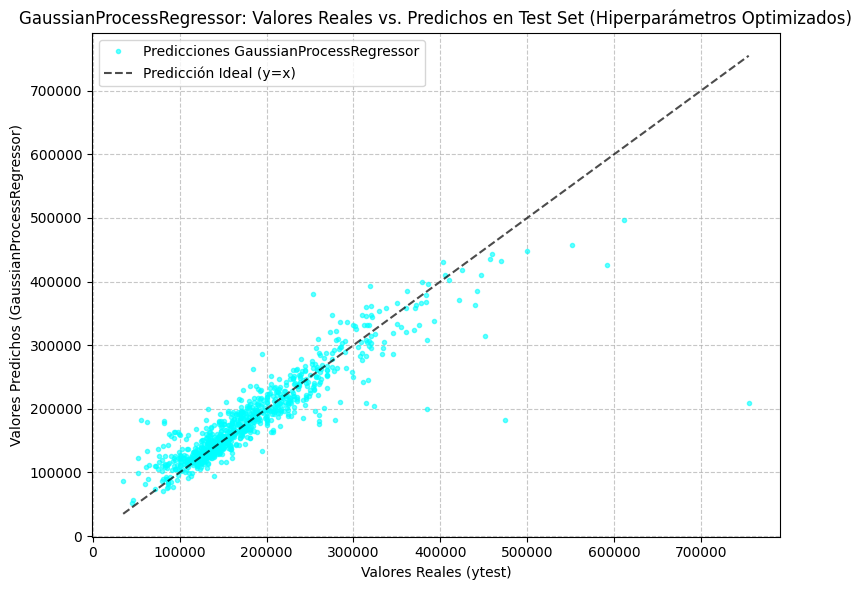

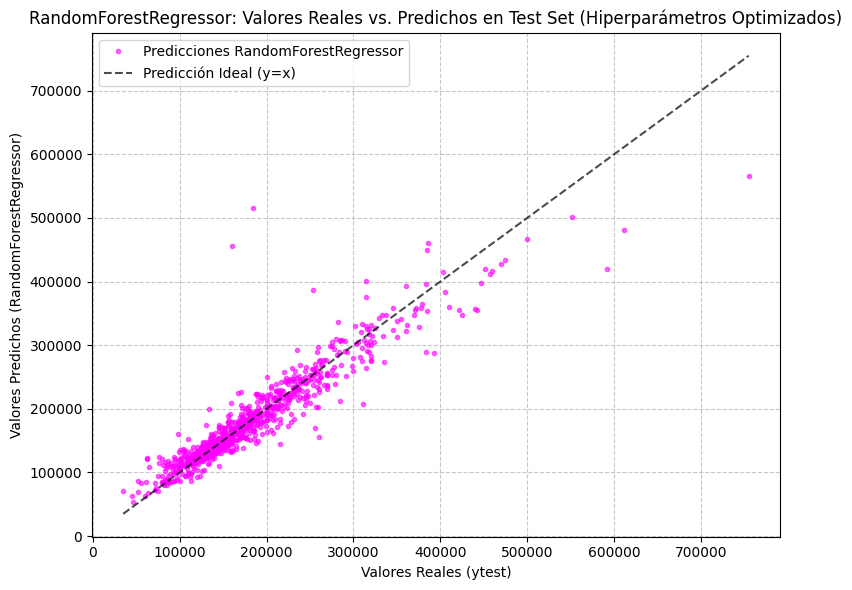

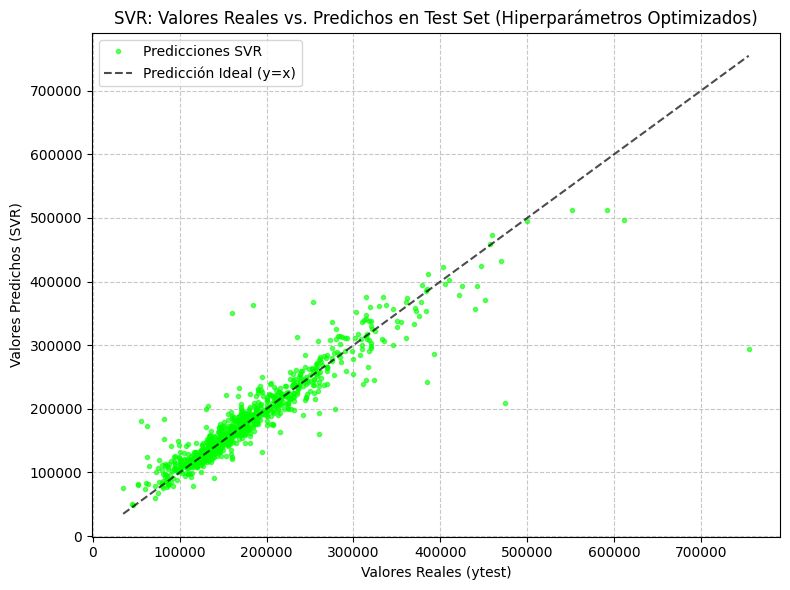


--- Resumen Comparativo de Rendimiento ---
Rendimiento en Validación Cruzada (Mejor RMSE y R2 con Hiperparámetros Optimizados):
  GaussianProcessRegressor: RMSE = 79149.223, R2 = -0.021 (Parámetros: {'gpr__alpha': np.float64(9.915644566638397e-08), 'gpr__kernel': 1**2 * RBF(length_scale=1)}) [Submuestra de CV]
  RandomForestRegressor: RMSE = 50491.318, R2 = 0.817 (Parámetros: {'rfr__max_features': np.float64(0.6523068845866853), 'rfr__min_samples_leaf': 1, 'rfr__n_estimators': 100}) [Submuestra de CV]
  SVR: RMSE = 56047.706, R2 = 0.718 (Parámetros: {'svr__C': np.float64(6.647135865318027), 'svr__epsilon': np.float64(0.04410482473745831), 'svr__gamma': np.float64(0.001567309546723541), 'svr__kernel': 'rbf'}) [Submuestra de CV]

Rendimiento Final en el Conjunto de Test (RMSE y R2):
  GaussianProcessRegressor: RMSE = 34324.315, R2 = 0.814
  RandomForestRegressor: RMSE = 27832.714, R2 = 0.878
  SVR: RMSE = 29658.056, R2 = 0.861


In [ ]:
# --- Generación de las gráficas de dispersión para todos los modelos ---
colors = {
    "LinearRegression": "blue",
    "Lasso": "red",
    "ElasticNet": "green",
    "KernelRidge": "purple",
    "SGDRegressor": "orange",
    "BayesianRidge": "brown",
    "GaussianProcessRegressor": "cyan",
    "RandomForestRegressor": "magenta",
    "SVR": "lime"
}

print("\n--- Generando Gráficas de Dispersión en Test Set ---")
for name, y_pred_test in y_preds_for_plot.items():
    plt.figure(figsize=(8, 6))
    plt.plot(ytest, y_pred_test, '.', alpha=0.6, color=colors.get(name, 'gray'), label=f'Predicciones {name}')
    plt.title(f'{name}: Valores Reales vs. Predichos en Test Set (Hiperparámetros Optimizados)')
    plt.xlabel('Valores Reales (ytest)')
    plt.ylabel(f'Valores Predichos ({name})')

    min_val = min(ytest.min(), y_pred_test.min())
    max_val = max(ytest.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.7, label='Predicción Ideal (y=x)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n--- Resumen Comparativo de Rendimiento ---")
print("Rendimiento en Validación Cruzada (Mejor RMSE y R2 con Hiperparámetros Optimizados):")
for name, res in results_cv_grid.items():
    if 'Best_Params' in res:
        if 'RMSE_CV_best_subsample' in res:
             print(f"  {name}: RMSE = {res['RMSE_CV_best_subsample']:.3f}, R2 = {res['R2_CV_best_subsample']:.3f} (Parámetros: {res['Best_Params']}) [Submuestra de CV]")
        else:
            print(f"  {name}: RMSE = {res['RMSE_CV_best']:.3f}, R2 = {res['R2_CV_best']:.3f} (Parámetros: {res['Best_Params']})")
    else:
        print(f"  {name}: RMSE = {res['RMSE_CV_mean']:.3f} +/- {res['RMSE_CV_std']:.3f}, R2 = {res['R2_CV_mean']:.3f} +/- {res['R2_CV_std']:.3f}")


print("\nRendimiento Final en el Conjunto de Test (RMSE y R2):")
for name, res in final_test_results.items():
    print(f"  {name}: RMSE = {res['RMSE_Test']:.3f}, R2 = {res['R2_Test']:.3f}")


# --- Guardar y_preds_for_plot (las predicciones) ---
if y_preds_for_plot:
    # Si 'search_tag' está definida en un ámbito superior (como en las respuestas anteriores),
    # puedes usarla aquí. Si no, defínela aquí si solo guardas este archivo con una etiqueta fija.
    # Por ejemplo, si este es el resultado de una corrida general o de tu mejor búsqueda:
    search_tag = "RandomizedSearch" # O "GridSearch", "RandomizedSearch", etc., según tu preferencia.

    # Guardar las predicciones. Como es un diccionario de arrays, pickle es el mejor.
    # Añade la etiqueta al nombre del archivo
    y_preds_pickle_path = os.path.join(DRIVE_OUTPUT_PATH, f'y_preds_for_plot_{search_tag}.pkl')
    with open(y_preds_pickle_path, 'wb') as f:
        pickle.dump(y_preds_for_plot, f)
    print(f"Predicciones ({search_tag}) guardadas en: {y_preds_pickle_path}")
else:
    print("No hay predicciones para guardar.")

##**OPTIMIZACION BAYESIANA CON MUESTREO TIPO GAUSSIAN PROCESSES**

### PIPE LINE

In [ ]:
# --- NUEVOS PIPELINES para GaussianProcessRegressor, RandomForestRegressor, SVR ---

pipeline_gpr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    # Se inicializa con un kernel compuesto para poder tunear sus componentes
    ('gpr', GaussianProcessRegressor(kernel=C(1.0) * RBF(1.0), random_state=42))
])

pipeline_rfr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('rfr', RandomForestRegressor(random_state=42, n_jobs=-1))
])

pipeline_svr = Pipeline(steps=[
    ('preproceso', mypre_houses(numerical_features=numerical_features, nominal_features=nominal_features, ordinal_features=ordinal_features, ordinal_categories_map=ordinal_categories_map)),
    ('scaler', StandardScaler()),
    ('svr', SVR())
])


# --- Esquema de validación cruzada ---
cv_very_light = KFold(n_splits=2, shuffle=True, random_state=42)

# --- NUEVO DICCIONARIO para modelos muy pesados con BAYESSEARCHCV ---
models_and_params_very_light = {
    "GaussianProcessRegressor": {
        "pipeline": pipeline_gpr,
        "param_space": {
            'gpr__kernel__k1__constant_value': Real(1e-3, 1e3, prior='log-uniform'),
            'gpr__kernel__k2__length_scale': Real(1e-2, 1e2, prior='log-uniform'),
            'gpr__alpha': Real(1e-10, 1e-2, prior='log-uniform')
        },
        "cv_folds": cv_very_light,
        "data_fraction": 0.1,
        "search_type": "BayesSearchCV",
        "n_iter": 20,
        # "n_initial_points": 5 # ELIMINADO: Este argumento causó el TypeError
    },
    "RandomForestRegressor": {
        "pipeline": pipeline_rfr,
        "param_space": {
            'rfr__n_estimators': Integer(50, 300),
            'rfr__max_features': Real(0.5, 1.0, prior='uniform'),
            'rfr__min_samples_leaf': Integer(1, 20)
        },
        "cv_folds": cv_very_light,
        "data_fraction": 0.2,
        "search_type": "BayesSearchCV",
        "n_iter": 30,
        # "n_initial_points": 10 # ELIMINADO: Este argumento causó el TypeError
    },
    "SVR": {
        "pipeline": pipeline_svr,
        "param_space": {
            'svr__kernel': Categorical(['rbf']),
            'svr__C': Real(0.1, 100.0, prior='log-uniform'),
            'svr__gamma': Real(1e-3, 1.0, prior='log-uniform'),
            'svr__epsilon': Real(0.01, 0.2, prior='uniform')
        },
        "cv_folds": cv_very_light,
        "data_fraction": 0.2,
        "search_type": "BayesSearchCV",
        "n_iter": 30,
        # "n_initial_points": 10 # ELIMINADO: Este argumento causó el TypeError
    }
}


best_estimators = {}
results_cv_grid = {}
final_test_results = {}
y_preds_for_plot = {}

# Función para calcular MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    non_zero_mask = y_true != 0
    if not np.all(non_zero_mask):
        warnings.warn("Se encontraron valores de y_true cero en el cálculo de MAPE. Se excluirán para evitar división por cero. Esto puede afectar la interpretabilidad si los ceros son valores válidos esperados.")
        y_true = y_true[non_zero_mask]
        y_pred = y_pred[non_zero_mask]
        if len(y_true) == 0:
            return np.nan

    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Función para calcular RMSE explícitamente
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Definir métricas de scoring para BayesSearchCV
scoring_metrics = {
    'rmse': make_scorer(root_mean_squared_error, greater_is_better=False),
    'r2': 'r2',
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'mape': make_scorer(mean_absolute_percentage_error, greater_is_better=False)
}

print("--- Optimizando y Evaluando Modelos ---")

# --- Procesar Modelos Muy Pesados (BayesSearchCV con submuestra) ---
print("\n--- Procesando Modelos Muy Pesados (GPR, RandomForest, SVR) con Optimización Bayesiana ---")

for name, config in models_and_params_very_light.items():
    print(f"\nProcesando {name} (Optimización Bayesiana)...")
    model_pipeline = config["pipeline"]
    param_space = config["param_space"]
    current_cv = config["cv_folds"]
    data_fraction = config["data_fraction"]
    n_iter_val = config["n_iter"]

    # Create a subsample for tuning this specific model
    Xtrain_subsample, _, ytrain_subsample_scaled, _ = train_test_split(
        Xtrain, ytrain_scaled, test_size=(1 - data_fraction), random_state=42
    )
    print(f"   Usando submuestra de entrenamiento para {name}: {Xtrain_subsample.shape[0]} muestras ({data_fraction*100:.0f}%)")


    search_object = BayesSearchCV(
        estimator=model_pipeline,
        search_spaces=param_space,
        n_iter=n_iter_val,
        # n_initial_points=n_initial_points, # ELIMINADO: Este argumento causó el TypeError
        cv=current_cv,
        scoring=scoring_metrics,
        refit='rmse',
        n_jobs=-1,
        verbose=1,
        random_state=42,
        return_train_score=True,
        error_score='raise'
    )

    print(f"   Buscando los mejores hiperparámetros para {name} en una submuestra muy ligera usando Optimización Bayesiana...")
    search_object.fit(Xtrain_subsample, ytrain_subsample_scaled)

    best_estimator_cv = search_object.best_estimator_
    best_params = search_object.best_params_

    # Get best RMSE (scaled) and R2 from CV results
    best_score_rmse_cv_scaled = -search_object.cv_results_['mean_test_rmse'][search_object.best_index_]
    best_score_r2_cv = search_object.cv_results_['mean_test_r2'][search_object.best_index_]
    best_score_mae_cv_scaled = -search_object.cv_results_['mean_test_mae'][search_object.best_index_]
    best_score_mape_cv = -search_object.cv_results_['mean_test_mape'][search_object.best_index_]

    # Convert RMSE and MAE back to original scale for reporting
    scale_factor = scaler_y.scale_[0] if scaler_y.scale_.ndim > 0 else scaler_y.scale_
    best_score_rmse_cv = best_score_rmse_cv_scaled * scale_factor
    best_score_mae_cv = best_score_mae_cv_scaled * scale_factor

    print(f"   Mejores parámetros para {name}: {best_params}")
    print(f"   RMSE (CV - Mejor en submuestra, escala original): {best_score_rmse_cv:.3f}")
    print(f"   R2 (CV - Mejor en submuestra):   {best_score_r2_cv:.3f}")
    print(f"   MAE (CV - Mejor en submuestra, escala original): {best_score_mae_cv:.3f}")
    print(f"   MAPE (CV - Mejor en submuestra): {best_score_mape_cv:.3f}%")


    print(f"   Reentrenando {name} con los parámetros óptimos en todo el conjunto de entrenamiento (y escalado)...")
    final_model_for_test = model_pipeline.set_params(**best_params)
    final_model_for_test.fit(Xtrain, ytrain_scaled)

    best_estimators[name] = final_model_for_test
    results_cv_grid[name] = {
        'Best_Params': best_params,
        'RMSE_CV_best_subsample': best_score_rmse_cv,
        'R2_CV_best_subsample': best_score_r2_cv,
        'MAE_CV_best_subsample': best_score_mae_cv,
        'MAPE_CV_best_subsample': best_score_mape_cv # No scaling for MAPE
    }

    print(f"   Evaluando {name} en el Test Set (modelo entrenado en Xtrain completo, y escalado)...")
    y_pred_test_scaled = final_model_for_test.predict(Xtest)
    y_pred_test = scaler_y.inverse_transform(y_pred_test_scaled.reshape(-1, 1)).ravel()

    y_preds_for_plot[name] = y_pred_test

    # Calculate all required metrics on the original scale
    mse_test = mean_squared_error(ytest, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(ytest, y_pred_test)
    mae_test = mean_absolute_error(ytest, y_pred_test)
    mape_test = mean_absolute_percentage_error(ytest, y_pred_test)

    final_test_results[name] = {
        'RMSE_Test': rmse_test,
        'R2_Test': r2_test,
        'MAE_Test': mae_test,
        'MAPE_Test': mape_test,
        'MSE_Test': mse_test
    }
    print(f"   RMSE (Test Set): {final_test_results[name]['RMSE_Test']:.3f}")
    print(f"   R2 (Test Set):   {final_test_results[name]['R2_Test']:.3f}")
    print(f"   MAE (Test Set):  {final_test_results[name]['MAE_Test']:.3f}")
    print(f"   MAPE (Test Set): {final_test_results[name]['MAPE_Test']:.3f}%")

print("\n--- Optimización Bayesiana para Modelos Muy Pesados Completada ---")

--- Optimizando y Evaluando Modelos ---

--- Procesando Modelos Muy Pesados (GPR, RandomForest, SVR) con Optimización Bayesiana ---

Procesando GaussianProcessRegressor (Optimización Bayesiana)...
   Usando submuestra de entrenamiento para GaussianProcessRegressor: 205 muestras (10%)
   Buscando los mejores hiperparámetros para GaussianProcessRegressor en una submuestra muy ligera usando Optimización Bayesiana...
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Fitting 2 folds for each of 1 candidates, totalling 

### GUARDADO

In [ ]:
# Define la misma ruta base en Drive donde guardas Xtest y ytest
# Asegúrate de que esta ruta sea accesible desde Colab
DRIVE_OUTPUT_PATH = '/content/drive/MyDrive/MODELOS_TAM/RESULTS_DATA' # <-- Nueva carpeta para resultados

# Crea la carpeta si no existe
os.makedirs(DRIVE_OUTPUT_PATH, exist_ok=True)
print(f"Directorio de resultados creado: {DRIVE_OUTPUT_PATH}")

# Define la etiqueta que quieres añadir a los nombres de los archivos
# Puedes cambiar esto a 'RandomizedSearch' o cualquier otra cosa si el contexto es diferente
search_tag = "Bayessian"

# --- Guardar resultados de final_test_results ---
if final_test_results:
    final_results_df = pd.DataFrame.from_dict(final_test_results, orient='index')
    # Añade la etiqueta al nombre del archivo
    final_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'final_test_results_{search_tag}.csv')
    final_results_df.to_csv(final_results_csv_path, index=True)
    print(f"Resultados de test ({search_tag}) guardados en: {final_results_csv_path}")
else:
    print("No hay resultados de test para guardar.")


# --- Guardar resultados de results_cv_grid ---
if results_cv_grid:
    cv_results_list = []
    for model_name, metrics in results_cv_grid.items():
        row = {'Model': model_name}
        for key, value in metrics.items():
            if isinstance(value, dict): # Para Best_Params
                for param_key, param_value in value.items():
                    row[f'Param_{param_key}'] = param_value
            else:
                row[key] = value
        cv_results_list.append(row)

    if cv_results_list:
        cv_results_df = pd.DataFrame(cv_results_list)
        # Añade la etiqueta al nombre del archivo
        cv_results_csv_path = os.path.join(DRIVE_OUTPUT_PATH, f'cv_grid_results_{search_tag}.csv')
        cv_results_df.to_csv(cv_results_csv_path, index=False)
        print(f"Resultados de CV ({search_tag}) guardados en: {cv_results_csv_path}")
    else:
        print("No hay resultados de CV para guardar.")
else:
    print("No hay resultados de CV para guardar.")

###VISUALIZACION OPTIMIZACIÓN BAYESIANA

---




--- Generando Gráficas de Dispersión en Test Set ---


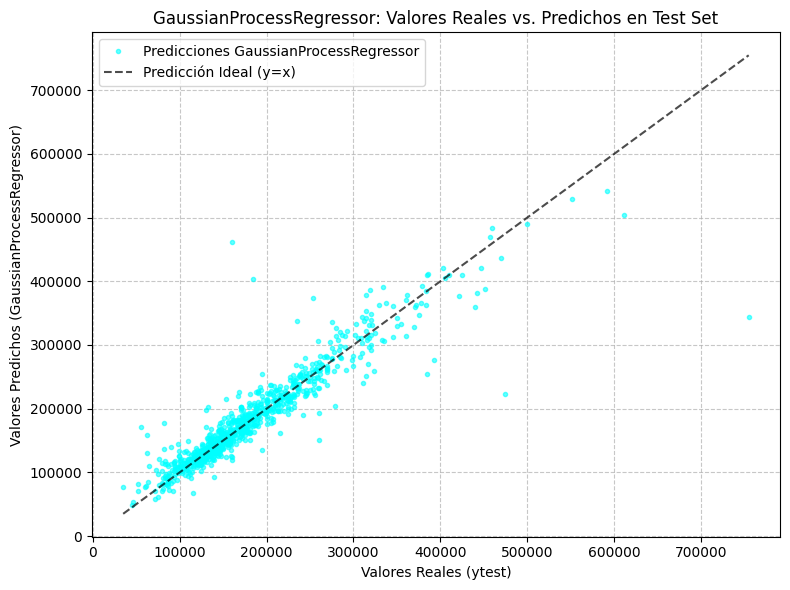

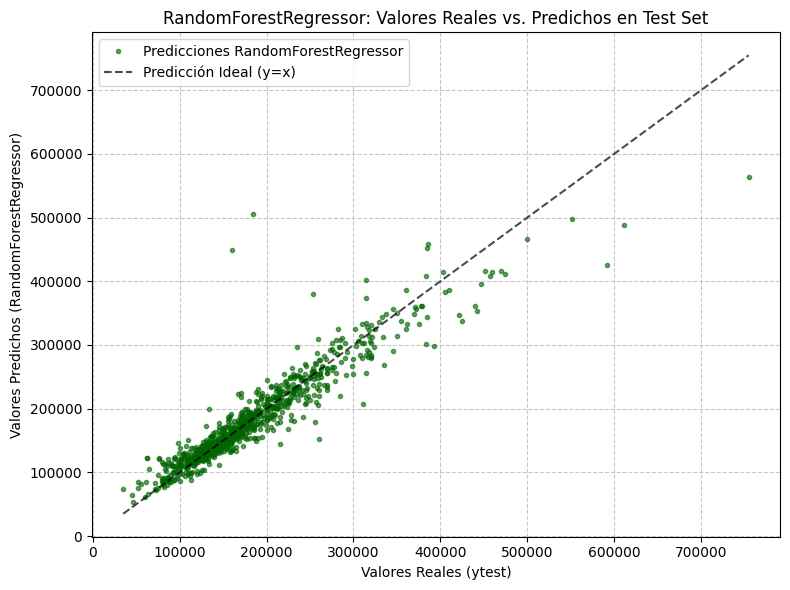

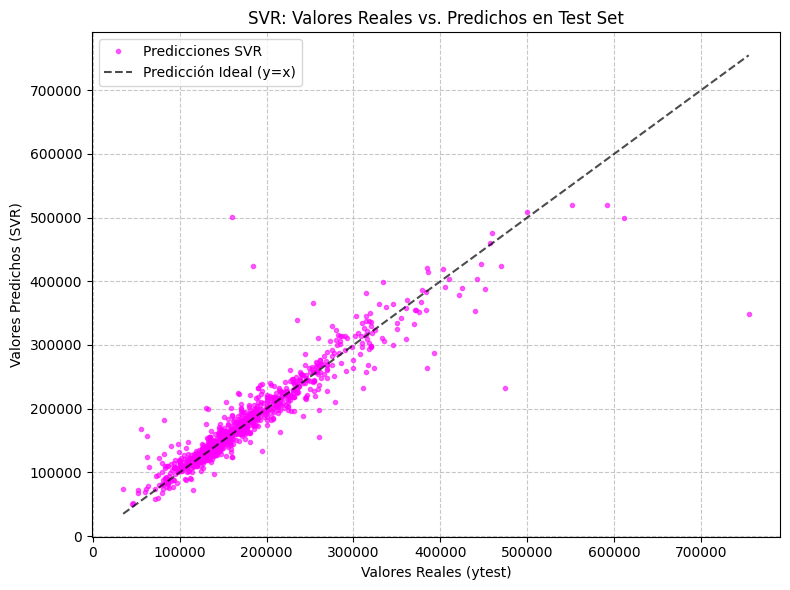


--- Resumen Comparativo de Rendimiento ---
Rendimiento en Validación Cruzada (RMSE, R2, MAE, MAPE en submuestra):
   GaussianProcessRegressor:
     RMSE = 46297.313
     R2   = 0.655
     MAE  = 23935.145
     MAPE = 388.814% (Parámetros: OrderedDict([('gpr__alpha', 0.00864668052403266), ('gpr__kernel__k1__constant_value', 0.007228573441695701), ('gpr__kernel__k2__length_scale', 4.215758921694554)])) [CV en submuestra]
   RandomForestRegressor:
     RMSE = 31833.445
     R2   = 0.818
     MAE  = 19125.643
     MAPE = 215.864% (Parámetros: OrderedDict([('rfr__max_features', 0.5209198145803623), ('rfr__min_samples_leaf', 1), ('rfr__n_estimators', 293)])) [CV en submuestra]
   SVR:
     RMSE = 37929.468
     R2   = 0.736
     MAE  = 19626.889
     MAPE = 298.327% (Parámetros: OrderedDict([('svr__C', 7.187534851406475), ('svr__epsilon', 0.01), ('svr__gamma', 0.001), ('svr__kernel', 'rbf')])) [CV en submuestra]

Rendimiento Final en el Conjunto de Test (RMSE, R2, MAE, MSE, MAPE):
   Gaussi

In [ ]:
# --- Código para el ploteo y resumen (con el ajuste para results_cv_grid) ---
colors = {
    "KernelRidge": "purple",
    "SGDRegressor": "orange",
    "BayesianRidge": "brown",
    "GaussianProcessRegressor": "cyan",
    "RandomForestRegressor": "darkgreen",
    "SVR": "magenta"
}

modelos_evaluados = y_preds_for_plot.keys()

print("\n--- Generando Gráficas de Dispersión en Test Set ---")
y_preds_for_plot_filtered = {name: y_pred for name, y_pred in y_preds_for_plot.items() if name in colors}

for name, y_pred_test in y_preds_for_plot_filtered.items():
    plt.figure(figsize=(8, 6))
    plt.plot(ytest, y_pred_test, '.', alpha=0.6, color=colors.get(name, 'gray'), label=f'Predicciones {name}')
    plt.title(f'{name}: Valores Reales vs. Predichos en Test Set')
    plt.xlabel('Valores Reales (ytest)')
    plt.ylabel(f'Valores Predichos ({name})')

    min_val = min(ytest.min(), y_pred_test.min())
    max_val = max(ytest.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.7, label='Predicción Ideal (y=x)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n--- Resumen Comparativo de Rendimiento ---")
print("Rendimiento en Validación Cruzada (RMSE, R2, MAE, MAPE en submuestra):")
for name, res in results_cv_grid.items():
    if name in modelos_evaluados:
        rmse_cv_best = res.get('RMSE_CV_best_subsample', float('nan'))
        r2_cv_best = res.get('R2_CV_best_subsample', float('nan'))
        mae_cv_best = res.get('MAE_CV_best_subsample', float('nan'))
        mape_cv_best = res.get('MAPE_CV_best_subsample', float('nan'))
        print(f"   {name}:")
        print(f"     RMSE = {rmse_cv_best:.3f}")
        print(f"     R2   = {r2_cv_best:.3f}")
        print(f"     MAE  = {mae_cv_best:.3f}")
        print(f"     MAPE = {mape_cv_best:.3f}% (Parámetros: {res['Best_Params']}) [CV en submuestra]")
    else:
        print(f"   {name}: No se encontraron resultados de CV en results_cv_grid.")


print("\nRendimiento Final en el Conjunto de Test (RMSE, R2, MAE, MSE, MAPE):")
for name, res in final_test_results.items():
    if name in modelos_evaluados:
        print(f"   {name}:")
        print(f"     RMSE = {res.get('RMSE_Test', float('nan')):.3f}")
        print(f"     R2   = {res.get('R2_Test', float('nan')):.3f}")
        print(f"     MAE  = {res.get('MAE_Test', float('nan')):.3f}")
        print(f"     MSE  = {res.get('MSE_Test', float('nan')):.3f}")
        print(f"     MAPE = {res.get('MAPE_Test', float('nan')):.3f}%")
    else:
        print(f"   {name}: No se encontraron resultados en final_test_results.")

# --- Guardar y_preds_for_plot (las predicciones) ---
if y_preds_for_plot:
    # Si 'search_tag' está definida en un ámbito superior (como en las respuestas anteriores),
    # puedes usarla aquí. Si no, defínela aquí si solo guardas este archivo con una etiqueta fija.
    # Por ejemplo, si este es el resultado de una corrida general o de tu mejor búsqueda:
    search_tag = "Bayessian" # O "GridSearch", "RandomizedSearch", etc., según tu preferencia.

    # Guardar las predicciones. Como es un diccionario de arrays, pickle es el mejor.
    # Añade la etiqueta al nombre del archivo
    y_preds_pickle_path = os.path.join(DRIVE_OUTPUT_PATH, f'y_preds_for_plot_{search_tag}.pkl')
    with open(y_preds_pickle_path, 'wb') as f:
        pickle.dump(y_preds_for_plot, f)
    print(f"Predicciones ({search_tag}) guardadas en: {y_preds_pickle_path}")
else:
    print("No hay predicciones para guardar.")

Exter Qual: Un coeficiente positivo y de buena magnitud para Exter Qual (como vimos en la gráfica) es muy intuitivo. Una mejor calidad exterior (Gd, Ex) debería aumentar significativamente el precio de la casa, mientras que una calidad Po o Fa lo reduciría. Si el coeficiente fuera negativo, como apareció en una de las gráficas, indicaría un posible problema con la codificación del orden o una relación compleja.

Pool QC: El coeficiente negativo muy grande para Pool QC . Aunque intuitivamente una piscina podría parecer que añade valor, en este dataset particular:
Son muy raras: La mayoría de las casas no tienen piscina.
Pueden ser atípicas: Las pocas casas con piscina a menudo pueden ser propiedades más antiguas, con piscinas que requieren mucho mantenimiento, o que no se consideran un activo deseable por la mayoría de los compradores en esa área particular, lo que puede resultar en un valor de venta más bajo o que el costo de la piscina no se recupere en la venta. Un Pool QC bajo (Fa o Po) o incluso la mera presencia de una piscina podría estar correlacionada con otros factores que disminuyen el valor general de la casa.

se hace esto por el Tipo de Modelo: Algunos modelos (como la regresión lineal múltiple) son más sensibles a la multicolinealidad que otros (como los modelos basados en árboles, Random Forest o Gradient Boosting).